# Part I - Prosper Loan Dataset
## by Festus Kipsang Sambu

## Introduction

Prosper loan dataset contains 113,937 loans with 81 variables on each loan, including loan amount, borrower rate (or interest rate), current loan status, borrower income, and many others.

Prosper was founded in 2005 as the first peer-to-peer lending marketplace in the United States. Since then, Prosper has facilitated more than USD 12 billion in loans to more than 770,000 people.
Through Prosper, people can invest in each other in a way that is financially and socially rewarding. Borrowers apply online for a fixed-rate, fixed-term loan between USD 2,000 and USD 40,000. Individuals and institutions can invest in the loans and earn attractive returns. Prosper handles all loan servicing on behalf of the matched borrowers and investors. (source: https://www.prosper.com/about)




In [1]:
# import all packages and set plots to be embedded inline
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns


from pandas_profiling import ProfileReport

import warnings
warnings.filterwarnings("ignore") # warnings off

%matplotlib inline

> Load in your dataset and describe its properties through the questions below. Try and motivate your exploration goals through this section.


In [2]:
prosper_df = pd.read_csv('prosperLoanData.csv')
prosper_df

,ListingKey,ListingNumber,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,...,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,1021339766868145413AB3B,193129,2007-08-26 19:09:29.263000000,C,36,Completed,2009-08-14 00:00:00,0.16516,0.1580,0.1380,...,-133.18,0.0,0.0,0.0,0.0,1.0,0,0,0.0,258
1,10273602499503308B223C1,1209647,2014-02-27 08:28:07.900000000,NaN,36,Current,NaN,0.12016,0.0920,0.0820,...,0.00,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
2,0EE9337825851032864889A,81716,2007-01-05 15:00:47.090000000,HR,36,Completed,2009-12-17 00:00:00,0.28269,0.2750,0.2400,...,-24.20,0.0,0.0,0.0,0.0,1.0,0,0,0.0,41
3,0EF5356002482715299901A,658116,2012-10-22 11:02:35.010000000,NaN,36,Current,NaN,0.12528,0.0974,0.0874,...,-108.01,0.0,0.0,0.0,0.0,1.0,0,0,0.0,158
4,0F023589499656230C5E3E2,909464,2013-09-14 18:38:39.097000000,NaN,36,Current,NaN,0.24614,0.2085,0.1985,...,-60.27,0.0,0.0,0.0,0.0,1.0,0,0,0.0,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113932,E6D9357655724827169606C,753087,2013-04-14 05:55:02.663000000,NaN,36,Current,NaN,0.22354,0.1864,0.1764,...,-75.58,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
113933,E6DB353036033497292EE43,537216,2011-11-03 20:42:55.333000000,NaN,36,FinalPaymentInProgress,NaN,0.13220,0.1110,0.1010,...,-30.05,0.0,0.0,0.0,0.0,1.0,0,0,0.0,22
113934,E6E13596170052029692BB1,1069178,2013-12-13 05:49:12.703000000,NaN,60,Current,NaN,0.23984,0.2150,0.2050,...,-16.91,0.0,0.0,0.0,0.0,1.0,0,0,0.0,119
113935,E6EB3531504622671970D9E,539056,2011-11-14 13:18:26.597000000,NaN,60,Completed,2013-08-13 00:00:00,0.28408,0.2605,0.2505,...,-235.05,0.0,0.0,0.0,0.0,1.0,0,0,0.0,274


In [3]:
prosper_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113937 entries, 0 to 113936
Data columns (total 81 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   ListingKey                           113937 non-null  object 
 1   ListingNumber                        113937 non-null  int64  
 2   ListingCreationDate                  113937 non-null  object 
 3   CreditGrade                          28953 non-null   object 
 4   Term                                 113937 non-null  int64  
 5   LoanStatus                           113937 non-null  object 
 6   ClosedDate                           55089 non-null   object 
 7   BorrowerAPR                          113912 non-null  float64
 8   BorrowerRate                         113937 non-null  float64
 9   LenderYield                          113937 non-null  float64
 10  EstimatedEffectiveYield              84853 non-null   float64
 11  EstimatedLoss

In [4]:
prosper_df.describe(include='all')

,ListingKey,ListingNumber,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,...,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
count,113937,1.139370e+05,113937,28953,113937.000000,113937,55089,113912.000000,113937.000000,113937.000000,...,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.00000,113937.000000,113937.000000
unique,113066,NaN,113064,8,NaN,12,2802,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,17A93590655669644DB4C06,NaN,2013-10-02 17:20:16.550000000,C,NaN,Current,2014-03-04 00:00:00,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,6,NaN,6,5649,NaN,56576,105,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,6.278857e+05,NaN,NaN,40.830248,NaN,NaN,0.218828,0.192764,0.182701,...,-54.725641,-14.242698,700.446342,681.420499,25.142686,0.998584,0.048027,0.02346,16.550751,80.475228
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
min,NaN,4.000000e+00,NaN,NaN,12.000000,NaN,NaN,0.006530,0.000000,-0.010000,...,-664.870000,-9274.750000,-94.200000,-954.550000,0.000000,0.700000,0.000000,0.00000,0.000000,1.000000
25%,NaN,4.009190e+05,NaN,NaN,36.000000,NaN,NaN,0.156290,0.134000,0.124200,...,-73.180000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.00000,0.000000,2.000000
50%,NaN,6.005540e+05,NaN,NaN,36.000000,NaN,NaN,0.209760,0.184000,0.173000,...,-34.440000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.00000,0.000000,44.000000
75%,NaN,8.926340e+05,NaN,NaN,36.000000,NaN,NaN,0.283810,0.250000,0.240000,...,-13.920000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.00000,0.000000,115.000000


In [5]:
df_description = pd.read_csv('Prosper Loan Data - Variable Definitions - Sheet1.csv')


In [6]:
#get description of all our columns in dataset

#source : https://stackoverflow.com/questions/33181846/programmatically-convert-pandas-dataframe-to-markdown-table
def pandas_df_to_markdown_table(df):
    from IPython.display import Markdown, display
    fmt = ['---' for i in range(len(df.columns))]
    df_fmt = pd.DataFrame([fmt], columns=df.columns)
    df_formatted = pd.concat([df_fmt, df])
    display(Markdown(df_formatted.to_csv(sep="|", index=False)))

pandas_df_to_markdown_table(df_description)

Variable|Description
---|---
ListingKey|Unique key for each listing, same value as the 'key' used in the listing object in the API.
ListingNumber|The number that uniquely identifies the listing to the public as displayed on the website.
ListingCreationDate|The date the listing was created.
CreditGrade|The Credit rating that was assigned at the time the listing went live. Applicable for listings pre-2009 period and will only be populated for those listings.
Term|The length of the loan expressed in months.
LoanStatus|The current status of the loan: Cancelled,  Chargedoff, Completed, Current, Defaulted, FinalPaymentInProgress, PastDue. The PastDue status will be accompanied by a delinquency bucket.
ClosedDate|Closed date is applicable for Cancelled, Completed, Chargedoff and Defaulted loan statuses. 
BorrowerAPR|The Borrower's Annual Percentage Rate (APR) for the loan.
BorrowerRate|The Borrower's interest rate for this loan. 
LenderYield|The Lender yield on the loan. Lender yield is equal to the interest rate on the loan less the servicing fee.
EstimatedEffectiveYield|Effective yield is equal to the borrower interest rate (i) minus the servicing fee rate, (ii) minus estimated uncollected interest on charge-offs, (iii) plus estimated collected late fees.  Applicable for loans originated after July 2009.
EstimatedLoss|Estimated loss is the estimated principal loss on charge-offs. Applicable for loans originated after July 2009.
EstimatedReturn|The estimated return assigned to the listing at the time it was created. Estimated return is the difference between the Estimated Effective Yield and the Estimated Loss Rate. Applicable for loans originated after July 2009.
ProsperRating (numeric)|The  Prosper Rating assigned at the time the listing was created: 0 - N/A, 1 - HR, 2 - E, 3 - D, 4 - C, 5 - B, 6 - A, 7 - AA.  Applicable for loans originated after July 2009.
ProsperRating (Alpha)|The Prosper Rating assigned at the time the listing was created between AA - HR.  Applicable for loans originated after July 2009.
ProsperScore|A custom risk score built using historical Prosper data. The score ranges from 1-10, with 10 being the best, or lowest risk score.  Applicable for loans originated after July 2009.
ListingCategory|The category of the listing that the borrower selected when posting their listing: 0 - Not Available, 1 - Debt Consolidation, 2 - Home Improvement, 3 - Business, 4 - Personal Loan, 5 - Student Use, 6 - Auto, 7- Other, 8 - Baby&Adoption, 9 - Boat, 10 - Cosmetic Procedure, 11 - Engagement Ring, 12 - Green Loans, 13 - Household Expenses, 14 - Large Purchases, 15 - Medical/Dental, 16 - Motorcycle, 17 - RV, 18 - Taxes, 19 - Vacation, 20 - Wedding Loans
BorrowerState|The two letter abbreviation of the state of the address of the borrower at the time the Listing was created.
Occupation|The Occupation selected by the Borrower at the time they created the listing.
EmploymentStatus|The employment status of the borrower at the time they posted the listing.
EmploymentStatusDuration|The length in months of the employment status at the time the listing was created.
IsBorrowerHomeowner|A Borrower will be classified as a homowner if they have a mortgage on their credit profile or provide documentation confirming they are a homeowner.
CurrentlyInGroup|Specifies whether or not the Borrower was in a group at the time the listing was created.
GroupKey|The Key of the group in which the Borrower is a member of. Value will be null if the borrower does not have a group affiliation.
DateCreditPulled|The date the credit profile was pulled. 
CreditScoreRangeLower|The lower value representing the range of the borrower's credit score as provided by a consumer credit rating agency.
CreditScoreRangeUpper|The upper value representing the range of the borrower's credit score as provided by a consumer credit rating agency. 
FirstRecordedCreditLine|The date the first credit line was opened.
CurrentCreditLines|Number of current credit lines at the time the credit profile was pulled.
OpenCreditLines|Number of open credit lines at the time the credit profile was pulled.
TotalCreditLinespast7years|Number of credit lines in the past seven years at the time the credit profile was pulled.
OpenRevolvingAccounts|Number of open revolving accounts at the time the credit profile was pulled.
OpenRevolvingMonthlyPayment|Monthly payment on revolving accounts at the time the credit profile was pulled.
InquiriesLast6Months|Number of inquiries in the past six months at the time the credit profile was pulled.
TotalInquiries|Total number of inquiries at the time the credit profile was pulled.
CurrentDelinquencies|Number of accounts delinquent at the time the credit profile was pulled.
AmountDelinquent|Dollars delinquent at the time the credit profile was pulled.
DelinquenciesLast7Years|Number of delinquencies in the past 7 years at the time the credit profile was pulled.
PublicRecordsLast10Years|Number of public records in the past 10 years at the time the credit profile was pulled.
PublicRecordsLast12Months|Number of public records in the past 12 months at the time the credit profile was pulled.
RevolvingCreditBalance|Dollars of revolving credit at the time the credit profile was pulled.
BankcardUtilization|The percentage of available revolving credit that is utilized at the time the credit profile was pulled.
AvailableBankcardCredit|The total available credit via bank card at the time the credit profile was pulled.
TotalTrades|Number of trade lines ever opened at the time the credit profile was pulled.
TradesNeverDelinquent|Number of trades that have never been delinquent at the time the credit profile was pulled.
TradesOpenedLast6Months|Number of trades opened in the last 6 months at the time the credit profile was pulled.
DebtToIncomeRatio|The debt to income ratio of the borrower at the time the credit profile was pulled. This value is Null if the debt to income ratio is not available. This value is capped at 10.01 (any debt to income ratio larger than 1000% will be returned as 1001%).
IncomeRange|The income range of the borrower at the time the listing was created.
IncomeVerifiable|The borrower indicated they have the required documentation to support their income.
StatedMonthlyIncome|The monthly income the borrower stated at the time the listing was created.
LoanKey|Unique key for each loan. This is the same key that is used in the API. 
TotalProsperLoans|Number of Prosper loans the borrower at the time they created this listing. This value will be null if the borrower had no prior loans. 
TotalProsperPaymentsBilled|Number of on time payments the borrower made on Prosper loans at the time they created this listing. This value will be null if the borrower had no prior loans.
OnTimeProsperPayments|Number of on time payments the borrower had made on Prosper loans at the time they created this listing. This value will be null if the borrower has no prior loans.
ProsperPaymentsLessThanOneMonthLate|Number of payments the borrower made on Prosper loans that were less than one month late at the time they created this listing. This value will be null if the borrower had no prior loans. 
ProsperPaymentsOneMonthPlusLate|Number of payments the borrower made on Prosper loans that were greater than one month late at the time they created this listing. This value will be null if the borrower had no prior loans.
ProsperPrincipalBorrowed|Total principal borrowed on Prosper loans at the time the listing was created. This value will be null if the borrower had no prior loans.
ProsperPrincipalOutstanding|Principal outstanding on Prosper loans at the time the listing was created. This value will be null if the borrower had no prior loans.
ScorexChangeAtTimeOfListing|Borrower's credit score change at the time the credit profile was pulled. This will be the change relative to the borrower's last Prosper loan. This value will be null if the borrower had no prior loans.
LoanCurrentDaysDelinquent|The number of days delinquent. 
LoanFirstDefaultedCycleNumber|The cycle the loan was charged off. If the loan has not charged off the value will be null. 
LoanMonthsSinceOrigination|Number of months since the loan originated.
LoanNumber|Unique numeric value associated with the loan.
LoanOriginalAmount|The origination amount of the loan.
LoanOriginationDate|The date the loan was originated.
LoanOriginationQuarter|The quarter in which the loan was originated.
MemberKey|The unique key that is associated with the borrower. This is the same identifier that is used in the API member object. 
MonthlyLoanPayment|The scheduled monthly loan payment.
LP_CustomerPayments|Pre charge-off cumulative gross payments made by the borrower on the loan. If the loan has charged off, this value will exclude any recoveries.
LP_CustomerPrincipalPayments|Pre charge-off cumulative principal payments made by the borrower on the loan. If the loan has charged off, this value will exclude any recoveries.
LP_InterestandFees|Pre charge-off cumulative interest and fees paid by the borrower. If the loan has charged off, this value will exclude any recoveries.
LP_ServiceFees|Cumulative service fees paid by the investors who have invested in the loan. 
LP_CollectionFees|Cumulative collection fees paid by the investors who have invested in the loan.
LP_GrossPrincipalLoss|The gross charged off amount of the loan.
LP_NetPrincipalLoss|The principal that remains uncollected after any recoveries.
LP_NonPrincipalRecoverypayments|The interest and fee component of any recovery payments. The current payment policy applies payments in the following order: Fees, interest, principal.
PercentFunded|Percent the listing was funded.
Recommendations|Number of recommendations the borrower had at the time the listing was created.
InvestmentFromFriendsCount|Number of friends that made an investment in the loan.
InvestmentFromFriendsAmount|Dollar amount of investments that were made by friends.
Investors|The number of investors that funded the loan.


### checking for Duplicate listings



In [7]:
print(f'The number of entries are {len(prosper_df)} and no. of unique listing are {prosper_df.ListingKey.nunique()}')

The number of entries are 113937 and no. of unique listing are 113066


From above, we can see that we have duplicate listings we will need check on it. 

In [8]:
prosper_df[prosper_df.ListingKey.duplicated() == True].count()['ListingKey']

871

In [9]:
prosper_df[prosper_df.ListingKey.duplicated() == True]['ListingKey'].head()


9       0F043596202561788EA13D5
999     0A0635972629771021E38F3
2539    2D2635984503681189056B4
4942    4B7E3590031274113F1FD34
5812    94B035909835592957503E6
Name: ListingKey, dtype: object

In [10]:
prosper_df[prosper_df.ListingKey == '0A0635972629771021E38F3']

,ListingKey,ListingNumber,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,...,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
998,0A0635972629771021E38F3,1055932,2013-12-18 14:25:17.053000000,NaN,60,Current,NaN,0.1771,0.1535,0.1435,...,0.0,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
999,0A0635972629771021E38F3,1055932,2013-12-18 14:25:17.053000000,NaN,60,Current,NaN,0.1771,0.1535,0.1435,...,0.0,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
57494,0A0635972629771021E38F3,1055932,2013-12-18 14:25:17.053000000,NaN,60,Current,NaN,0.1771,0.1535,0.1435,...,0.0,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1


In [11]:
prosper_df[prosper_df.ListingKey == '2D2635984503681189056B4']

,ListingKey,ListingNumber,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,...,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
1554,2D2635984503681189056B4,1097584,2014-01-11 07:50:08.037000000,NaN,60,Current,NaN,0.14528,0.1224,0.1124,...,0.0,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
2539,2D2635984503681189056B4,1097584,2014-01-11 07:50:08.037000000,NaN,60,Current,NaN,0.14528,0.1224,0.1124,...,0.0,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1


It seems like we get duplicate listingKeys because duplicate rows have different ProsperScore. We will drop those rows with duplicate keys since they are not many and won't intefere much with our analysis. 

In [12]:
prosper_df.drop_duplicates(subset = 'ListingKey', inplace = True)

In [13]:
prosper_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 113066 entries, 0 to 113936
Data columns (total 81 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   ListingKey                           113066 non-null  object 
 1   ListingNumber                        113066 non-null  int64  
 2   ListingCreationDate                  113066 non-null  object 
 3   CreditGrade                          28953 non-null   object 
 4   Term                                 113066 non-null  int64  
 5   LoanStatus                           113066 non-null  object 
 6   ClosedDate                           55076 non-null   object 
 7   BorrowerAPR                          113041 non-null  float64
 8   BorrowerRate                         113066 non-null  float64
 9   LenderYield                          113066 non-null  float64
 10  EstimatedEffectiveYield              83982 non-null   float64
 11  EstimatedLoss

### Preminary EDA using pandas Profiling

I will use Pandas profiling to understand each variable individually and select the best variables for understanding what factors affect orrower's Annual Percentage Rate (APR) for the loan. 

In [14]:
#profile = ProfileReport(prosper_df, title="Prosper Data Profiling Report", minimal=True)
#profile.to_file("Prosper Data Profiling Report.html")
#profile

There are many learnings from above report such as distributions, column descriptions, warnings such as high number of zeros in a columns, columns which are wrong datatype such as ListingCreationDate which we will clean later. After much deliberation, I have selected 16 columns which I feel will give us relevant learnings. 

In [15]:
# this variable subset will be a starting point for further cleaning and investigation of relevant data
prosper_reduced_data = prosper_df[['ListingKey', 'ListingCreationDate', 'ClosedDate', 'LoanStatus', 'Term', 'LoanOriginalAmount', 'MonthlyLoanPayment',\
              'ListingCategory (numeric)', 'BorrowerAPR', 'BorrowerRate', \
              'CreditGrade', 'ProsperRating (Alpha)', 'CreditScoreRangeLower', 'CreditScoreRangeUpper',\
              'IncomeRange', 'IncomeVerifiable', 'StatedMonthlyIncome', 'DebtToIncomeRatio', 'EmploymentStatus',\
              'EmploymentStatusDuration','IsBorrowerHomeowner']]
prosper_reduced_data.head()

,ListingKey,ListingCreationDate,ClosedDate,LoanStatus,Term,LoanOriginalAmount,MonthlyLoanPayment,ListingCategory (numeric),BorrowerAPR,BorrowerRate,...,ProsperRating (Alpha),CreditScoreRangeLower,CreditScoreRangeUpper,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,DebtToIncomeRatio,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner
0,1021339766868145413AB3B,2007-08-26 19:09:29.263000000,2009-08-14 00:00:00,Completed,36,9425,330.43,0,0.16516,0.1580,...,NaN,640.0,659.0,"$25,000-49,999",True,3083.333333,0.17,Self-employed,2.0,True
1,10273602499503308B223C1,2014-02-27 08:28:07.900000000,NaN,Current,36,10000,318.93,2,0.12016,0.0920,...,A,680.0,699.0,"$50,000-74,999",True,6125.000000,0.18,Employed,44.0,False
2,0EE9337825851032864889A,2007-01-05 15:00:47.090000000,2009-12-17 00:00:00,Completed,36,3001,123.32,0,0.28269,0.2750,...,NaN,480.0,499.0,Not displayed,True,2083.333333,0.06,Not available,NaN,False
3,0EF5356002482715299901A,2012-10-22 11:02:35.010000000,NaN,Current,36,10000,321.45,16,0.12528,0.0974,...,A,800.0,819.0,"$25,000-49,999",True,2875.000000,0.15,Employed,113.0,True
4,0F023589499656230C5E3E2,2013-09-14 18:38:39.097000000,NaN,Current,36,15000,563.97,2,0.24614,0.2085,...,D,680.0,699.0,"$100,000+",True,9583.333333,0.26,Employed,44.0,True


In [16]:
prosper_reduced_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 113066 entries, 0 to 113936
Data columns (total 21 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   ListingKey                 113066 non-null  object 
 1   ListingCreationDate        113066 non-null  object 
 2   ClosedDate                 55076 non-null   object 
 3   LoanStatus                 113066 non-null  object 
 4   Term                       113066 non-null  int64  
 5   LoanOriginalAmount         113066 non-null  int64  
 6   MonthlyLoanPayment         113066 non-null  float64
 7   ListingCategory (numeric)  113066 non-null  int64  
 8   BorrowerAPR                113041 non-null  float64
 9   BorrowerRate               113066 non-null  float64
 10  CreditGrade                28953 non-null   object 
 11  ProsperRating (Alpha)      83982 non-null   object 
 12  CreditScoreRangeLower      112475 non-null  float64
 13  CreditScoreRangeUpper      11

In [17]:
prosper_reduced_data.describe(include= 'all')

,ListingKey,ListingCreationDate,ClosedDate,LoanStatus,Term,LoanOriginalAmount,MonthlyLoanPayment,ListingCategory (numeric),BorrowerAPR,BorrowerRate,...,ProsperRating (Alpha),CreditScoreRangeLower,CreditScoreRangeUpper,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,DebtToIncomeRatio,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner
count,113066,113066,55076,113066,113066.00000,113066.000000,113066.000000,113066.000000,113041.00000,113066.000000,...,83982,112475.000000,112475.000000,113066,113066,1.130660e+05,104594.000000,110811,105441.000000,113066
unique,113066,113064,2802,12,NaN,NaN,NaN,NaN,NaN,NaN,...,7,NaN,NaN,8,2,NaN,NaN,8,NaN,2
top,1021339766868145413AB3B,2013-06-03 17:27:50.540000000,2014-03-04 00:00:00,Current,NaN,NaN,NaN,NaN,NaN,NaN,...,C,NaN,NaN,"$25,000-49,999",True,NaN,NaN,Employed,NaN,True
freq,1,2,105,55730,NaN,NaN,NaN,NaN,NaN,NaN,...,18096,NaN,NaN,31940,104479,NaN,NaN,66598,NaN,57052
mean,NaN,NaN,NaN,NaN,40.80017,8314.762307,271.932742,2.776838,0.21898,0.192946,...,NaN,685.524961,704.524961,NaN,NaN,5.605120e+03,0.276032,NaN,96.060584,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
min,NaN,NaN,NaN,NaN,12.00000,1000.000000,0.000000,0.000000,0.00653,0.000000,...,NaN,0.000000,19.000000,NaN,NaN,0.000000e+00,0.000000,NaN,0.000000,NaN
25%,NaN,NaN,NaN,NaN,36.00000,4000.000000,130.950000,1.000000,0.15629,0.134000,...,NaN,660.000000,679.000000,NaN,NaN,3.199396e+03,0.140000,NaN,26.000000,NaN
50%,NaN,NaN,NaN,NaN,36.00000,6300.000000,217.370000,1.000000,0.20984,0.184000,...,NaN,680.000000,699.000000,NaN,NaN,4.666667e+03,0.220000,NaN,67.000000,NaN
75%,NaN,NaN,NaN,NaN,36.00000,12000.000000,370.570000,3.000000,0.28386,0.250600,...,NaN,720.000000,739.000000,NaN,NaN,6.824688e+03,0.320000,NaN,137.000000,NaN


In [18]:
#profile = ProfileReport(prosper_reduced_data, title="Prosper Data Profiling Report", explorative=True)
#profile.to_file("Reduced Prosper Data Profiling Report.html")
#profile

## Data cleaning

In [19]:
#Convert Listing Creation date and Closed Date to datetime

prosper_reduced_data.ListingCreationDate = pd.to_datetime(prosper_reduced_data.ListingCreationDate,  errors='coerce')
prosper_reduced_data.ClosedDate = pd.to_datetime(prosper_reduced_data.ClosedDate,  errors='coerce')

In [20]:
prosper_reduced_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 113066 entries, 0 to 113936
Data columns (total 21 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   ListingKey                 113066 non-null  object        
 1   ListingCreationDate        113066 non-null  datetime64[ns]
 2   ClosedDate                 55076 non-null   datetime64[ns]
 3   LoanStatus                 113066 non-null  object        
 4   Term                       113066 non-null  int64         
 5   LoanOriginalAmount         113066 non-null  int64         
 6   MonthlyLoanPayment         113066 non-null  float64       
 7   ListingCategory (numeric)  113066 non-null  int64         
 8   BorrowerAPR                113041 non-null  float64       
 9   BorrowerRate               113066 non-null  float64       
 10  CreditGrade                28953 non-null   object        
 11  ProsperRating (Alpha)      83982 non-null   object  

In [21]:
#change column names with spaces
prosper_reduced_data.rename(columns={'ListingCategory (numeric)': 'ListingCategory', 'ProsperRating (Alpha)': 'ProsperRating'}, inplace=True)
prosper_reduced_data.head()

,ListingKey,ListingCreationDate,ClosedDate,LoanStatus,Term,LoanOriginalAmount,MonthlyLoanPayment,ListingCategory,BorrowerAPR,BorrowerRate,...,ProsperRating,CreditScoreRangeLower,CreditScoreRangeUpper,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,DebtToIncomeRatio,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner
0,1021339766868145413AB3B,2007-08-26 19:09:29.263,2009-08-14,Completed,36,9425,330.43,0,0.16516,0.1580,...,NaN,640.0,659.0,"$25,000-49,999",True,3083.333333,0.17,Self-employed,2.0,True
1,10273602499503308B223C1,2014-02-27 08:28:07.900,NaT,Current,36,10000,318.93,2,0.12016,0.0920,...,A,680.0,699.0,"$50,000-74,999",True,6125.000000,0.18,Employed,44.0,False
2,0EE9337825851032864889A,2007-01-05 15:00:47.090,2009-12-17,Completed,36,3001,123.32,0,0.28269,0.2750,...,NaN,480.0,499.0,Not displayed,True,2083.333333,0.06,Not available,NaN,False
3,0EF5356002482715299901A,2012-10-22 11:02:35.010,NaT,Current,36,10000,321.45,16,0.12528,0.0974,...,A,800.0,819.0,"$25,000-49,999",True,2875.000000,0.15,Employed,113.0,True
4,0F023589499656230C5E3E2,2013-09-14 18:38:39.097,NaT,Current,36,15000,563.97,2,0.24614,0.2085,...,D,680.0,699.0,"$100,000+",True,9583.333333,0.26,Employed,44.0,True


In [22]:
#checking on missing values in Employment status
prosper_reduced_data.EmploymentStatus.value_counts()

Employed         66598
Full-time        26354
Self-employed     6052
Not available     5347
Other             3742
Part-time         1088
Not employed       835
Retired            795
Name: EmploymentStatus, dtype: int64

In [23]:
prosper_reduced_data[prosper_reduced_data.EmploymentStatus.isna()].sort_values(by = 'ListingCreationDate')

,ListingKey,ListingCreationDate,ClosedDate,LoanStatus,Term,LoanOriginalAmount,MonthlyLoanPayment,ListingCategory,BorrowerAPR,BorrowerRate,...,ProsperRating,CreditScoreRangeLower,CreditScoreRangeUpper,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,DebtToIncomeRatio,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner
113921,D21A33647075665665BE266,2005-11-09 20:44:28.847,2005-11-25,Completed,36,1000,29.52,0,NaN,0.0400,...,NaN,NaN,NaN,Not displayed,True,12500.000000,0.23284,NaN,NaN,False
106735,97B333660731451030726AF,2005-11-11 08:46:17.303,2006-02-07,Completed,36,1500,45.60,0,NaN,0.0595,...,NaN,NaN,NaN,Not displayed,True,14583.333333,0.01747,NaN,NaN,False
25166,B3083364738592238DBDA63,2005-11-15 16:06:47.457,2005-11-29,Completed,36,1000,29.68,0,NaN,0.0435,...,NaN,NaN,NaN,Not displayed,True,9166.666667,0.04120,NaN,NaN,False
62297,2F25336514614362295DA03,2005-11-15 18:25:56.107,2005-11-30,Completed,36,1000,35.65,0,NaN,0.1700,...,NaN,NaN,NaN,Not displayed,True,10000.000000,0.01783,NaN,NaN,False
90598,B87F3364623805558A45EAB,2005-11-18 13:39:03.263,2005-11-29,Completed,36,1000,33.21,0,NaN,0.1200,...,NaN,NaN,NaN,Not displayed,True,16666.666667,0.01051,NaN,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57106,21F83380195431266D92121,2007-02-05 20:54:50.233,2007-12-10,Completed,36,5000,170.89,0,0.14709,0.1400,...,NaN,620.0,639.0,Not displayed,True,5416.666667,0.07000,NaN,NaN,False
13239,B1A13379859311513B13011,2007-02-07 11:53:37.327,2010-01-20,Completed,36,2000,61.75,0,0.07852,0.0700,...,NaN,700.0,719.0,Not displayed,True,2333.333333,0.26000,NaN,NaN,False
22979,57AB338020191550932BC4A,2007-02-07 12:03:49.340,2010-02-02,Completed,36,2000,64.42,0,0.15239,0.1435,...,NaN,600.0,619.0,Not displayed,True,1916.666667,0.04000,NaN,NaN,False
66469,6F793380667470304C450E0,2007-02-07 21:07:47.410,2007-09-04,Completed,36,4000,140.41,0,0.16607,0.1589,...,NaN,600.0,619.0,Not displayed,True,2500.000000,0.09000,NaN,NaN,False


In [24]:
df = prosper_reduced_data[prosper_reduced_data.EmploymentStatus.isna()].sort_values(by = 'ListingCreationDate')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2255 entries, 113921 to 7312
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   ListingKey                2255 non-null   object        
 1   ListingCreationDate       2255 non-null   datetime64[ns]
 2   ClosedDate                2255 non-null   datetime64[ns]
 3   LoanStatus                2255 non-null   object        
 4   Term                      2255 non-null   int64         
 5   LoanOriginalAmount        2255 non-null   int64         
 6   MonthlyLoanPayment        2255 non-null   float64       
 7   ListingCategory           2255 non-null   int64         
 8   BorrowerAPR               2230 non-null   float64       
 9   BorrowerRate              2255 non-null   float64       
 10  CreditGrade               2255 non-null   object        
 11  ProsperRating             0 non-null      object        
 12  CreditScoreRang

In [25]:
df.LoanStatus.value_counts()

Completed     1439
Defaulted      522
Chargedoff     291
Cancelled        3
Name: LoanStatus, dtype: int64

In [26]:
#get no. of listings without Employment Status
len(prosper_reduced_data[prosper_reduced_data.EmploymentStatus.isna()])

2255

We have 2255 Records missing employment status, they all seem to data recorded between 2005 to 2007 and they are closed. Due to the small no. of accounts compared to entire df, I will remove those accounts from our analysis

In [27]:

prosper_reduced_data = prosper_reduced_data[prosper_reduced_data.EmploymentStatus.notna()]
prosper_reduced_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 110811 entries, 0 to 113936
Data columns (total 21 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   ListingKey                110811 non-null  object        
 1   ListingCreationDate       110811 non-null  datetime64[ns]
 2   ClosedDate                52821 non-null   datetime64[ns]
 3   LoanStatus                110811 non-null  object        
 4   Term                      110811 non-null  int64         
 5   LoanOriginalAmount        110811 non-null  int64         
 6   MonthlyLoanPayment        110811 non-null  float64       
 7   ListingCategory           110811 non-null  int64         
 8   BorrowerAPR               110811 non-null  float64       
 9   BorrowerRate              110811 non-null  float64       
 10  CreditGrade               26698 non-null   object        
 11  ProsperRating             83982 non-null   object        
 12  Cr

In [28]:
#
prosper_reduced_data.IncomeRange.value_counts()

$25,000-49,999    31940
$50,000-74,999    30749
$100,000+         17188
$75,000-99,999    16780
$1-24,999          7241
Not displayed      5486
Not employed        806
$0                  621
Name: IncomeRange, dtype: int64

In [29]:
# reduce no. of IncomeRange categories by 1
prosper_reduced_data.IncomeRange.replace({'$0': 'Not employed'}, inplace=True) 

In [30]:
#test above code
prosper_reduced_data.IncomeRange.value_counts()

$25,000-49,999    31940
$50,000-74,999    30749
$100,000+         17188
$75,000-99,999    16780
$1-24,999          7241
Not displayed      5486
Not employed       1427
Name: IncomeRange, dtype: int64

Using Pandas Profiling report, CreditGrade and ProsperRating seems like they have the same column values. Let's deep dive into that and clean if necessary

In [31]:
prosper_reduced_data.CreditGrade.value_counts()



C     5282
D     4799
B     4149
AA    3296
A     3128
HR    3061
E     2884
NC      99
Name: CreditGrade, dtype: int64

In [32]:
prosper_reduced_data.ProsperRating.value_counts()

C     18096
B     15368
A     14390
D     14170
E      9716
HR     6917
AA     5325
Name: ProsperRating, dtype: int64

Checking relationship between Credit Grade and Prosper Rating. I will take a sample and see if there are similarities between the 2 Scoring systems

In [33]:
prosper_reduced_data[['ListingKey','CreditGrade', 'ProsperRating']].sample(30)


,ListingKey,CreditGrade,ProsperRating
64760,CB8834323303410492DF2D4,C,NaN
59766,FED935981369218955FA420,NaN,A
26226,58AC357892393312576812B,NaN,A
82309,DD483387846613495622AB3,C,NaN
112794,C7AE341345096620750A557,HR,NaN
...,...,...,...
110427,B3173583447567738231199,NaN,C
78530,484B35781082899903F3B92,NaN,E
31023,94CB34096522248047880B2,AA,NaN
80271,544E358960053626992F596,NaN,E


There seems to be situation where if creditGrade is missing the ProsperRaating is available. I will combine the two Scores and use the combined column as CreditRiskScore


In [34]:
prosper_reduced_data['CreditRiskScore'] = np.where(prosper_reduced_data.CreditGrade.isna(), prosper_reduced_data.ProsperRating, prosper_reduced_data.CreditGrade)
prosper_reduced_data.head(10)

,ListingKey,ListingCreationDate,ClosedDate,LoanStatus,Term,LoanOriginalAmount,MonthlyLoanPayment,ListingCategory,BorrowerAPR,BorrowerRate,...,CreditScoreRangeLower,CreditScoreRangeUpper,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,DebtToIncomeRatio,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CreditRiskScore
0,1021339766868145413AB3B,2007-08-26 19:09:29.263,2009-08-14,Completed,36,9425,330.43,0,0.16516,0.1580,...,640.0,659.0,"$25,000-49,999",True,3083.333333,0.17,Self-employed,2.0,True,C
1,10273602499503308B223C1,2014-02-27 08:28:07.900,NaT,Current,36,10000,318.93,2,0.12016,0.0920,...,680.0,699.0,"$50,000-74,999",True,6125.000000,0.18,Employed,44.0,False,A
2,0EE9337825851032864889A,2007-01-05 15:00:47.090,2009-12-17,Completed,36,3001,123.32,0,0.28269,0.2750,...,480.0,499.0,Not displayed,True,2083.333333,0.06,Not available,NaN,False,HR
3,0EF5356002482715299901A,2012-10-22 11:02:35.010,NaT,Current,36,10000,321.45,16,0.12528,0.0974,...,800.0,819.0,"$25,000-49,999",True,2875.000000,0.15,Employed,113.0,True,A
4,0F023589499656230C5E3E2,2013-09-14 18:38:39.097,NaT,Current,36,15000,563.97,2,0.24614,0.2085,...,680.0,699.0,"$100,000+",True,9583.333333,0.26,Employed,44.0,True,D
5,0F05359734824199381F61D,2013-12-14 08:26:37.093,NaT,Current,60,15000,342.37,1,0.15425,0.1314,...,740.0,759.0,"$100,000+",True,8333.333333,0.36,Employed,82.0,True,B
6,0F0A3576754255009D63151,2013-04-12 09:52:56.147,NaT,Current,36,3000,122.67,1,0.31032,0.2712,...,680.0,699.0,"$25,000-49,999",True,2083.333333,0.27,Employed,172.0,False,E
7,0F1035772717087366F9EA7,2013-05-05 06:49:27.493,NaT,Current,36,10000,372.60,2,0.23939,0.2019,...,700.0,719.0,"$25,000-49,999",True,3355.750000,0.24,Employed,103.0,False,C
8,0F043596202561788EA13D5,2013-12-02 10:43:39.117,NaT,Current,36,10000,305.54,7,0.07620,0.0629,...,820.0,839.0,"$25,000-49,999",True,3333.333333,0.25,Employed,269.0,True,AA
10,0F123545674891886D9F106,2012-05-10 07:04:01.577,NaT,Current,60,13500,395.37,1,0.27462,0.2489,...,640.0,659.0,"$75,000-99,999",True,7500.000000,0.12,Employed,300.0,False,C


In [35]:
prosper_reduced_data.CreditRiskScore.value_counts()

C     23378
B     19517
D     18969
A     17518
E     12600
HR     9978
AA     8621
NC       99
Name: CreditRiskScore, dtype: int64

In [36]:
# the other two ratings columns will not be needed anymore
prosper_reduced_data.drop(['CreditGrade', 'ProsperRating'], axis=1, inplace=True)

In [37]:
prosper_reduced_data

,ListingKey,ListingCreationDate,ClosedDate,LoanStatus,Term,LoanOriginalAmount,MonthlyLoanPayment,ListingCategory,BorrowerAPR,BorrowerRate,CreditScoreRangeLower,CreditScoreRangeUpper,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,DebtToIncomeRatio,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CreditRiskScore
0,1021339766868145413AB3B,2007-08-26 19:09:29.263,2009-08-14,Completed,36,9425,330.43,0,0.16516,0.1580,640.0,659.0,"$25,000-49,999",True,3083.333333,0.17,Self-employed,2.0,True,C
1,10273602499503308B223C1,2014-02-27 08:28:07.900,NaT,Current,36,10000,318.93,2,0.12016,0.0920,680.0,699.0,"$50,000-74,999",True,6125.000000,0.18,Employed,44.0,False,A
2,0EE9337825851032864889A,2007-01-05 15:00:47.090,2009-12-17,Completed,36,3001,123.32,0,0.28269,0.2750,480.0,499.0,Not displayed,True,2083.333333,0.06,Not available,NaN,False,HR
3,0EF5356002482715299901A,2012-10-22 11:02:35.010,NaT,Current,36,10000,321.45,16,0.12528,0.0974,800.0,819.0,"$25,000-49,999",True,2875.000000,0.15,Employed,113.0,True,A
4,0F023589499656230C5E3E2,2013-09-14 18:38:39.097,NaT,Current,36,15000,563.97,2,0.24614,0.2085,680.0,699.0,"$100,000+",True,9583.333333,0.26,Employed,44.0,True,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113932,E6D9357655724827169606C,2013-04-14 05:55:02.663,NaT,Current,36,10000,364.74,1,0.22354,0.1864,700.0,719.0,"$50,000-74,999",True,4333.333333,0.13,Employed,246.0,True,C
113933,E6DB353036033497292EE43,2011-11-03 20:42:55.333,NaT,FinalPaymentInProgress,36,2000,65.57,7,0.13220,0.1110,700.0,719.0,"$75,000-99,999",True,8041.666667,0.11,Employed,21.0,True,A
113934,E6E13596170052029692BB1,2013-12-13 05:49:12.703,NaT,Current,60,10000,273.35,1,0.23984,0.2150,700.0,719.0,"$25,000-49,999",True,2875.000000,0.51,Employed,84.0,True,D
113935,E6EB3531504622671970D9E,2011-11-14 13:18:26.597,2013-08-13,Completed,60,15000,449.55,2,0.28408,0.2605,680.0,699.0,"$25,000-49,999",True,3875.000000,0.48,Full-time,94.0,True,C


In [38]:
#Employment Duration
borrowers_without_employment_duration_df = prosper_reduced_data[prosper_reduced_data.EmploymentStatusDuration.isnull() == True]
borrowers_without_employment_duration_df

,ListingKey,ListingCreationDate,ClosedDate,LoanStatus,Term,LoanOriginalAmount,MonthlyLoanPayment,ListingCategory,BorrowerAPR,BorrowerRate,CreditScoreRangeLower,CreditScoreRangeUpper,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,DebtToIncomeRatio,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CreditRiskScore
2,0EE9337825851032864889A,2007-01-05 15:00:47.090,2009-12-17,Completed,36,3001,123.32,0,0.28269,0.2750,480.0,499.0,Not displayed,True,2083.333333,0.06,Not available,NaN,False,HR
17,0FDF336575182398852A8DC,2006-08-15 12:21:09.433,2008-05-22,Chargedoff,36,10000,334.54,0,0.13202,0.1250,760.0,779.0,Not displayed,True,5833.333333,0.12,Not available,NaN,True,AA
42,10AD33803102786533722BB,2007-02-04 17:24:27.850,2008-08-08,Chargedoff,36,1500,62.86,0,0.30300,0.2900,520.0,539.0,Not displayed,True,416.666667,0.27,Not available,NaN,False,HR
63,0F1A336989050248528ED31,2006-10-07 00:32:48.020,2007-04-13,Completed,36,6000,251.43,0,0.29776,0.2900,620.0,639.0,Not displayed,True,7500.000000,0.25,Not available,NaN,True,D
76,0DFD336490760860963B515,2006-07-11 20:48:47.660,2007-08-10,Completed,36,2200,87.47,0,0.25861,0.2500,540.0,559.0,Not displayed,True,8583.333333,0.13,Not available,NaN,True,E
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113797,E467337109094381251D0BB,2006-10-18 11:35:37.843,2008-03-30,Defaulted,36,4500,147.32,0,0.11696,0.1100,660.0,679.0,Not displayed,True,4166.666667,0.04,Not available,NaN,False,C
113819,CF913368831369031FEEAB6,2006-09-14 13:19:21.320,2009-09-03,Completed,36,3000,107.56,0,0.18123,0.1740,660.0,679.0,Not displayed,True,4583.333333,0.13,Not available,NaN,True,C
113825,CFB1338127898040944BD47,2007-02-05 11:42:34.790,2010-01-13,Completed,36,2550,106.86,0,0.29776,0.2900,520.0,539.0,Not displayed,True,8833.333333,0.08,Not available,NaN,False,HR
113848,FFF0338012502972731B2C1,2007-02-07 15:04:40.563,2010-02-13,Completed,36,1000,0.00,0,0.30709,0.2875,0.0,19.0,Not displayed,True,833.333333,NaN,Not available,NaN,False,NC


In [39]:
print(f'min Date without employment duration is {borrowers_without_employment_duration_df.ListingCreationDate.min()} and max date was {borrowers_without_employment_duration_df.ListingCreationDate.max()}')

min Date without employment duration is 2006-02-15 14:21:25.347000 and max date was 2013-09-16 14:47:16.037000


In [40]:
borrowers_without_employment_duration_df.EmploymentStatus.value_counts()

Not available    5347
Full-time          13
Other               6
Self-employed       2
Not employed        1
Employed            1
Name: EmploymentStatus, dtype: int64

In [41]:
#non-available borrowers without employment status in raw data before filtering 
prosper_reduced_data[prosper_reduced_data.EmploymentStatus == 'Not available']['EmploymentStatusDuration'].head()

2    NaN
17   NaN
42   NaN
63   NaN
76   NaN
Name: EmploymentStatusDuration, dtype: float64

In [42]:
#most of the borrowers didn't give employmentStatus when onboarded, I will let it as it is

In [43]:
# Convert CreditGrade,IncomeRange as ordered categorical vars
var_dict = {'CreditRiskScore': ['AA', 'A', 'B', 'C', 'D', 'E', 'HR', 'NC'],
           'IncomeRange': ['Not displayed', 'Not employed', '$1-24,999', 
                           '$25,000-49,999', '$50,000-74,999', '$75,000-99,999', '$100,000+']}
for var in var_dict:
    ordered_var = pd.api.types.CategoricalDtype(ordered=True, categories = var_dict[var])
    prosper_reduced_data[var] = prosper_reduced_data[var].astype(ordered_var)

### What is the structure of your dataset?

A data set from Prosper, which is America’s first marketplace lending platform, with over $7 billion in funded loans. This data set contains 113,937 loans with 81 variables on each loan, including loan amount, borrower rate (or interest rate), current loan status, borrower income, borrower employment status, borrower credit history, and the latest payment information.

### What is/are the main feature(s) of interest in your dataset?

What factors affect borrower's APR score.


### What features in the dataset do you think will help support your investigation into your feature(s) of interest?

The supporting features of interest are the loan characteristics on the one hand, such as the loan amount, the date when the loan was taken, the term of the loan, the status of the loan, and some borrower characteristics on the other hand, such as the income, the employment and housing situation and debt to income ration of the borrower.


## Univariate Exploration
 


In [44]:
prosper_reduced_data.head()

,ListingKey,ListingCreationDate,ClosedDate,LoanStatus,Term,LoanOriginalAmount,MonthlyLoanPayment,ListingCategory,BorrowerAPR,BorrowerRate,CreditScoreRangeLower,CreditScoreRangeUpper,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,DebtToIncomeRatio,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CreditRiskScore
0,1021339766868145413AB3B,2007-08-26 19:09:29.263,2009-08-14,Completed,36,9425,330.43,0,0.16516,0.1580,640.0,659.0,"$25,000-49,999",True,3083.333333,0.17,Self-employed,2.0,True,C
1,10273602499503308B223C1,2014-02-27 08:28:07.900,NaT,Current,36,10000,318.93,2,0.12016,0.0920,680.0,699.0,"$50,000-74,999",True,6125.000000,0.18,Employed,44.0,False,A
2,0EE9337825851032864889A,2007-01-05 15:00:47.090,2009-12-17,Completed,36,3001,123.32,0,0.28269,0.2750,480.0,499.0,Not displayed,True,2083.333333,0.06,Not available,NaN,False,HR
3,0EF5356002482715299901A,2012-10-22 11:02:35.010,NaT,Current,36,10000,321.45,16,0.12528,0.0974,800.0,819.0,"$25,000-49,999",True,2875.000000,0.15,Employed,113.0,True,A
4,0F023589499656230C5E3E2,2013-09-14 18:38:39.097,NaT,Current,36,15000,563.97,2,0.24614,0.2085,680.0,699.0,"$100,000+",True,9583.333333,0.26,Employed,44.0,True,D


In [45]:
prosper_reduced_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 110811 entries, 0 to 113936
Data columns (total 20 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   ListingKey                110811 non-null  object        
 1   ListingCreationDate       110811 non-null  datetime64[ns]
 2   ClosedDate                52821 non-null   datetime64[ns]
 3   LoanStatus                110811 non-null  object        
 4   Term                      110811 non-null  int64         
 5   LoanOriginalAmount        110811 non-null  int64         
 6   MonthlyLoanPayment        110811 non-null  float64       
 7   ListingCategory           110811 non-null  int64         
 8   BorrowerAPR               110811 non-null  float64       
 9   BorrowerRate              110811 non-null  float64       
 10  CreditScoreRangeLower     110809 non-null  float64       
 11  CreditScoreRangeUpper     110809 non-null  float64       
 12  In

### Listing Category 
Convert it from int to category

In [46]:
prosper_reduced_data['ListingCategory'] = prosper_reduced_data['ListingCategory'].astype('category')
prosper_reduced_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 110811 entries, 0 to 113936
Data columns (total 20 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   ListingKey                110811 non-null  object        
 1   ListingCreationDate       110811 non-null  datetime64[ns]
 2   ClosedDate                52821 non-null   datetime64[ns]
 3   LoanStatus                110811 non-null  object        
 4   Term                      110811 non-null  int64         
 5   LoanOriginalAmount        110811 non-null  int64         
 6   MonthlyLoanPayment        110811 non-null  float64       
 7   ListingCategory           110811 non-null  category      
 8   BorrowerAPR               110811 non-null  float64       
 9   BorrowerRate              110811 non-null  float64       
 10  CreditScoreRangeLower     110809 non-null  float64       
 11  CreditScoreRangeUpper     110809 non-null  float64       
 12  In

In [47]:
#get histogram for all numerical columns
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

prosper_reduced_data_numerical = prosper_reduced_data.select_dtypes(include=numerics)
prosper_reduced_data_numerical

,Term,LoanOriginalAmount,MonthlyLoanPayment,BorrowerAPR,BorrowerRate,CreditScoreRangeLower,CreditScoreRangeUpper,StatedMonthlyIncome,DebtToIncomeRatio,EmploymentStatusDuration
0,36,9425,330.43,0.16516,0.1580,640.0,659.0,3083.333333,0.17,2.0
1,36,10000,318.93,0.12016,0.0920,680.0,699.0,6125.000000,0.18,44.0
2,36,3001,123.32,0.28269,0.2750,480.0,499.0,2083.333333,0.06,NaN
3,36,10000,321.45,0.12528,0.0974,800.0,819.0,2875.000000,0.15,113.0
4,36,15000,563.97,0.24614,0.2085,680.0,699.0,9583.333333,0.26,44.0
...,...,...,...,...,...,...,...,...,...,...
113932,36,10000,364.74,0.22354,0.1864,700.0,719.0,4333.333333,0.13,246.0
113933,36,2000,65.57,0.13220,0.1110,700.0,719.0,8041.666667,0.11,21.0
113934,60,10000,273.35,0.23984,0.2150,700.0,719.0,2875.000000,0.51,84.0
113935,60,15000,449.55,0.28408,0.2605,680.0,699.0,3875.000000,0.48,94.0


In [48]:
list(prosper_reduced_data_numerical.columns)

['Term',
 'LoanOriginalAmount',
 'MonthlyLoanPayment',
 'BorrowerAPR',
 'BorrowerRate',
 'CreditScoreRangeLower',
 'CreditScoreRangeUpper',
 'StatedMonthlyIncome',
 'DebtToIncomeRatio',
 'EmploymentStatusDuration']

In [49]:
plt.rcParams['figure.figsize'] = (20, 10)

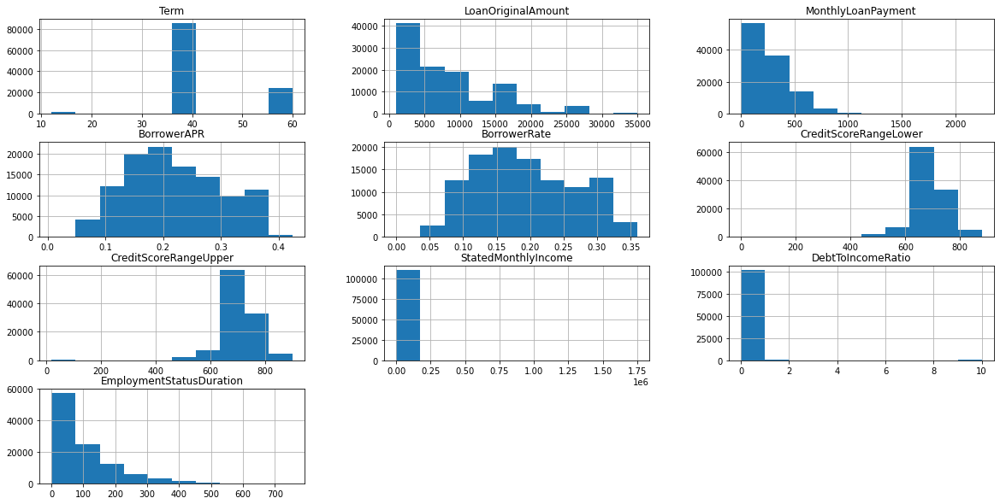

In [50]:
#histograms
prosper_reduced_data_numerical.hist(list(prosper_reduced_data_numerical.columns));


Note for above visualization:

LoanOriginalAmount, EmploymentstatusDuration, MonthlyLoanPayment: These columns are positively Skewed. We will dig in deeper to try different bins

CreditScoreRangelower, CreditScoreRangeUpper: They are normally distributed and look kind of similar

BorrowerRate, BoorrowerAPR: These columns have a similar distribution structure

In [51]:
#get Categorical Columns. 

prosper_reduced_data_object = prosper_reduced_data.select_dtypes(include=['object', 'category'])
#exclude listingid
prosper_reduced_data_object = prosper_reduced_data_object.iloc[:, 1:]
prosper_reduced_data_object

,LoanStatus,ListingCategory,IncomeRange,EmploymentStatus,CreditRiskScore
0,Completed,0,"$25,000-49,999",Self-employed,C
1,Current,2,"$50,000-74,999",Employed,A
2,Completed,0,Not displayed,Not available,HR
3,Current,16,"$25,000-49,999",Employed,A
4,Current,2,"$100,000+",Employed,D
...,...,...,...,...,...
113932,Current,1,"$50,000-74,999",Employed,C
113933,FinalPaymentInProgress,7,"$75,000-99,999",Employed,A
113934,Current,1,"$25,000-49,999",Employed,D
113935,Completed,2,"$25,000-49,999",Full-time,C


In [52]:
#plot countplots 
def countplotfunc(df, col):
    
    plt.rcParams["figure.figsize"] = (20,7)
    counts = df[col].value_counts()
    status_order = counts.index
    max_count = counts[0]
    max_prop = max_count / df.shape[0]
    tick_props = np.arange(0, max_prop, 0.1)
    tick_names = ['{:0.2f}'.format(v) for v in tick_props]
    
    title = col + ' Value Distribution'
    ax = sns.countplot(data = df, x = col, order = status_order, color = 'blue').set(title = title)
    plt.xticks(rotation = 45)
    
    # values must be ordered from the largest for this to work
    for i in range(counts.shape[0]):
        count = counts[i]
        pct_string = '{:0.1f}%'.format(100 * count / df.shape[0])
        plt.text(i, count+10, pct_string, ha = 'center')

    plt.tight_layout();
    
    

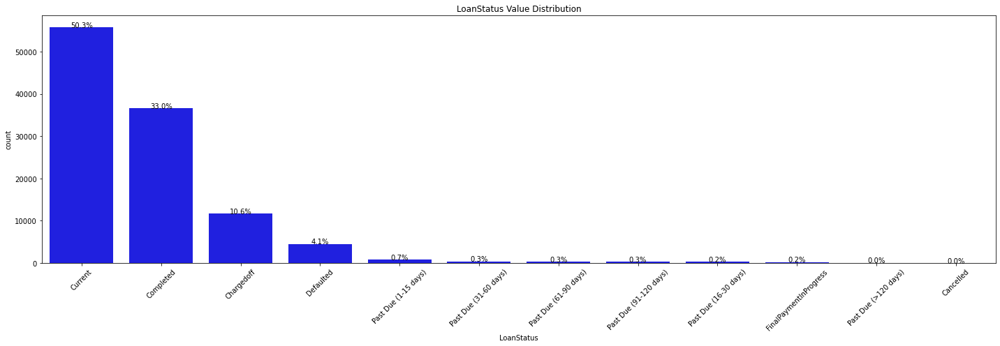

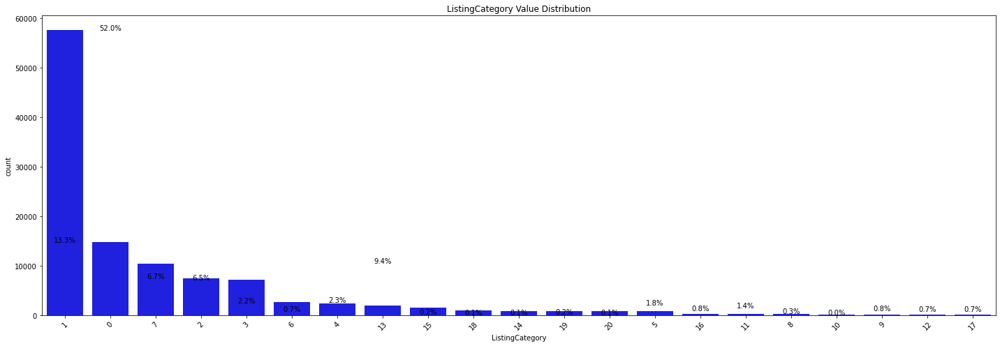

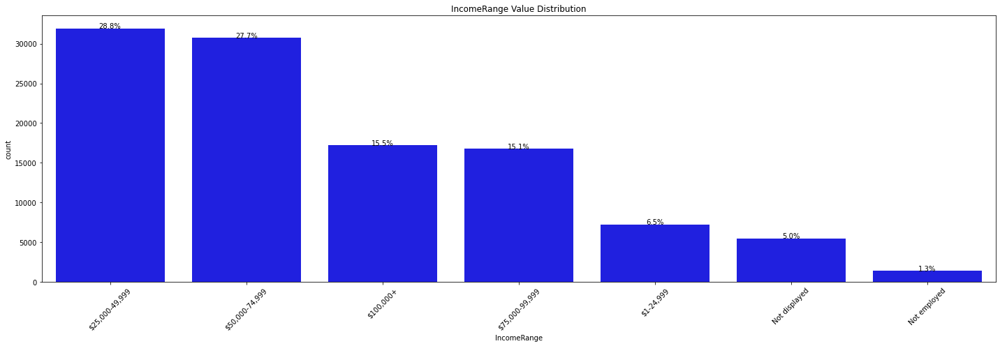

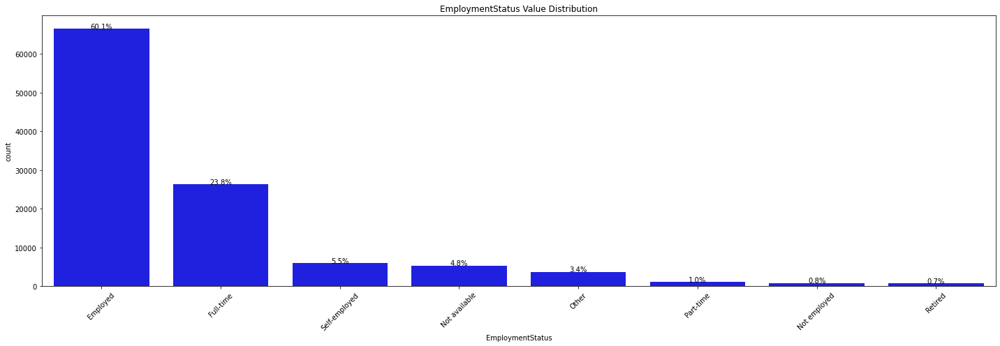

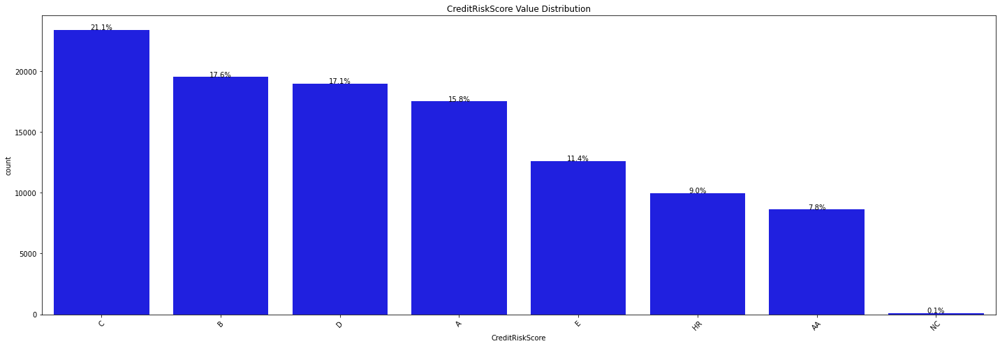

In [53]:
for col in list(prosper_reduced_data_object):
    countplotfunc(prosper_reduced_data_object, col)
    plt.show()

Notes: 

CreditRiskScore: Most borrowers are in category C followed by B and least is NC

Employment Status: Most borrowers are employed(60.1%).

IncomeRange: Borrowers income between $25000 - $75000 (56% of customer Base)

LoanStatus: Half of borrowers are currently paying for their loans well followed by completed at 33%

ListingCategory: 50% of borrower's are for Debt Consolidation followed by Not available

In [54]:
# Boolean columns
prosper_boolean = prosper_reduced_data.select_dtypes(include=bool)

In [55]:
def piecharts(df, col):
    df[col].value_counts().plot(kind = 'pie', autopct='%1.0f%%');
    plt.show()

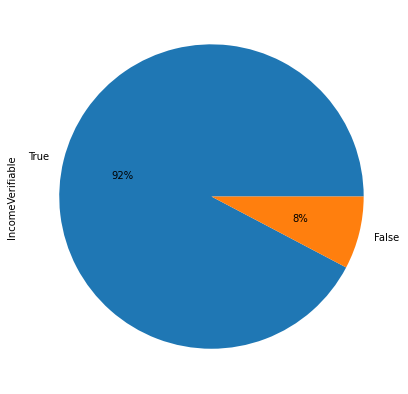

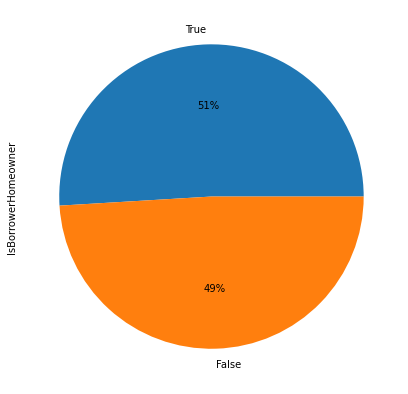

In [56]:
for col in list(prosper_boolean.columns):
    piecharts(prosper_boolean, col)

**Note**:

IsBorrowerHomeowner: Very Slightly more customers have homes compared to those without homes

Incomeverfiable: 92% of borrowers are verifiable

### MonthlyLoanPayment

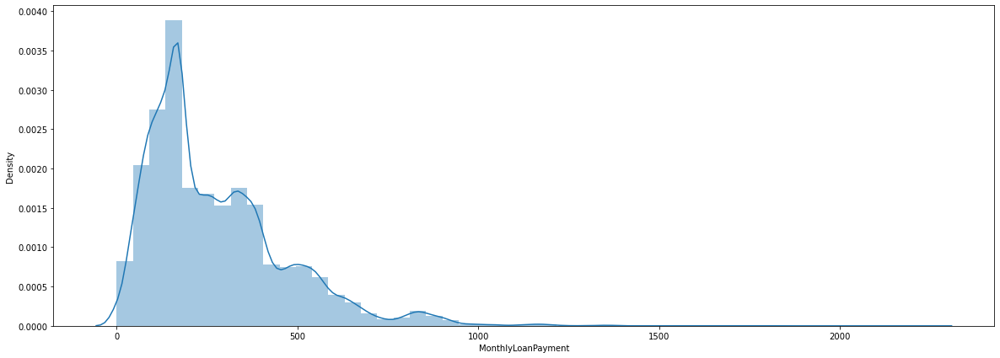

In [57]:
sns.distplot(prosper_reduced_data['MonthlyLoanPayment']);

In [58]:
prosper_reduced_data['MonthlyLoanPayment'].describe()

count    110811.000000
mean        274.236988
std         192.719850
min           0.000000
25%         134.020000
50%         220.730000
75%         372.710000
max        2251.510000
Name: MonthlyLoanPayment, dtype: float64

This column is positively skewed with a log tail and presence of outliers in monthly loan Payment. 

### CreditScoreRangeLower and CreditScoreRangeUpper

We will look at these two variables together to compare the gap between them.

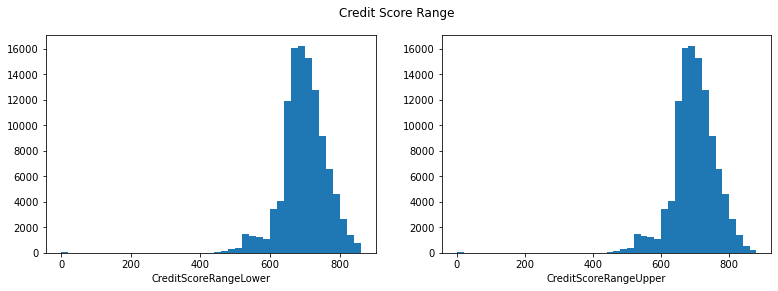

In [59]:
plt.figure(figsize=(13,4))
plt.suptitle("Credit Score Range")
plt.subplot(1,2,1)
bins_lower = np.arange(0, df.CreditScoreRangeLower.max()+20, 20)
plt.hist(data = prosper_reduced_data, x = 'CreditScoreRangeLower', bins = bins_lower)
plt.xlabel('CreditScoreRangeLower')
plt.subplot(1,2,2)
bins_upper = np.arange(0, df.CreditScoreRangeUpper.max()+20, 20)
plt.hist(data = prosper_reduced_data, x = 'CreditScoreRangeUpper', bins = bins_upper)
plt.xlabel('CreditScoreRangeUpper');

In [60]:
prosper_reduced_data[['CreditScoreRangeLower', 'CreditScoreRangeUpper']].describe()

,CreditScoreRangeLower,CreditScoreRangeUpper
count,110809.000000,110809.000000
mean,686.846917,705.846917
std,64.549893,64.549893
min,0.000000,19.000000
25%,660.000000,679.000000
50%,680.000000,699.000000
75%,720.000000,739.000000
max,880.000000,899.000000


The two distributions are very similar and this is because the range buckets are not large (they are of size 20) and here are all the existing buckets listed. I will keep **CreditScoreRangeLower** and drop the other

In [61]:
prosper_reduced_data.drop('CreditScoreRangeUpper', axis = 1, inplace = True)

In [62]:
prosper_reduced_data.rename(columns = {'CreditScoreRangeLower': 'CreditScoreRange'})

,ListingKey,ListingCreationDate,ClosedDate,LoanStatus,Term,LoanOriginalAmount,MonthlyLoanPayment,ListingCategory,BorrowerAPR,BorrowerRate,CreditScoreRange,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,DebtToIncomeRatio,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CreditRiskScore
0,1021339766868145413AB3B,2007-08-26 19:09:29.263,2009-08-14,Completed,36,9425,330.43,0,0.16516,0.1580,640.0,"$25,000-49,999",True,3083.333333,0.17,Self-employed,2.0,True,C
1,10273602499503308B223C1,2014-02-27 08:28:07.900,NaT,Current,36,10000,318.93,2,0.12016,0.0920,680.0,"$50,000-74,999",True,6125.000000,0.18,Employed,44.0,False,A
2,0EE9337825851032864889A,2007-01-05 15:00:47.090,2009-12-17,Completed,36,3001,123.32,0,0.28269,0.2750,480.0,Not displayed,True,2083.333333,0.06,Not available,NaN,False,HR
3,0EF5356002482715299901A,2012-10-22 11:02:35.010,NaT,Current,36,10000,321.45,16,0.12528,0.0974,800.0,"$25,000-49,999",True,2875.000000,0.15,Employed,113.0,True,A
4,0F023589499656230C5E3E2,2013-09-14 18:38:39.097,NaT,Current,36,15000,563.97,2,0.24614,0.2085,680.0,"$100,000+",True,9583.333333,0.26,Employed,44.0,True,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113932,E6D9357655724827169606C,2013-04-14 05:55:02.663,NaT,Current,36,10000,364.74,1,0.22354,0.1864,700.0,"$50,000-74,999",True,4333.333333,0.13,Employed,246.0,True,C
113933,E6DB353036033497292EE43,2011-11-03 20:42:55.333,NaT,FinalPaymentInProgress,36,2000,65.57,7,0.13220,0.1110,700.0,"$75,000-99,999",True,8041.666667,0.11,Employed,21.0,True,A
113934,E6E13596170052029692BB1,2013-12-13 05:49:12.703,NaT,Current,60,10000,273.35,1,0.23984,0.2150,700.0,"$25,000-49,999",True,2875.000000,0.51,Employed,84.0,True,D
113935,E6EB3531504622671970D9E,2011-11-14 13:18:26.597,2013-08-13,Completed,60,15000,449.55,2,0.28408,0.2605,680.0,"$25,000-49,999",True,3875.000000,0.48,Full-time,94.0,True,C


In [63]:
prosper_reduced_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 110811 entries, 0 to 113936
Data columns (total 19 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   ListingKey                110811 non-null  object        
 1   ListingCreationDate       110811 non-null  datetime64[ns]
 2   ClosedDate                52821 non-null   datetime64[ns]
 3   LoanStatus                110811 non-null  object        
 4   Term                      110811 non-null  int64         
 5   LoanOriginalAmount        110811 non-null  int64         
 6   MonthlyLoanPayment        110811 non-null  float64       
 7   ListingCategory           110811 non-null  category      
 8   BorrowerAPR               110811 non-null  float64       
 9   BorrowerRate              110811 non-null  float64       
 10  CreditScoreRangeLower     110809 non-null  float64       
 11  IncomeRange               110811 non-null  category      
 12  In

In [64]:
prosper_reduced_data

,ListingKey,ListingCreationDate,ClosedDate,LoanStatus,Term,LoanOriginalAmount,MonthlyLoanPayment,ListingCategory,BorrowerAPR,BorrowerRate,CreditScoreRangeLower,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,DebtToIncomeRatio,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CreditRiskScore
0,1021339766868145413AB3B,2007-08-26 19:09:29.263,2009-08-14,Completed,36,9425,330.43,0,0.16516,0.1580,640.0,"$25,000-49,999",True,3083.333333,0.17,Self-employed,2.0,True,C
1,10273602499503308B223C1,2014-02-27 08:28:07.900,NaT,Current,36,10000,318.93,2,0.12016,0.0920,680.0,"$50,000-74,999",True,6125.000000,0.18,Employed,44.0,False,A
2,0EE9337825851032864889A,2007-01-05 15:00:47.090,2009-12-17,Completed,36,3001,123.32,0,0.28269,0.2750,480.0,Not displayed,True,2083.333333,0.06,Not available,NaN,False,HR
3,0EF5356002482715299901A,2012-10-22 11:02:35.010,NaT,Current,36,10000,321.45,16,0.12528,0.0974,800.0,"$25,000-49,999",True,2875.000000,0.15,Employed,113.0,True,A
4,0F023589499656230C5E3E2,2013-09-14 18:38:39.097,NaT,Current,36,15000,563.97,2,0.24614,0.2085,680.0,"$100,000+",True,9583.333333,0.26,Employed,44.0,True,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113932,E6D9357655724827169606C,2013-04-14 05:55:02.663,NaT,Current,36,10000,364.74,1,0.22354,0.1864,700.0,"$50,000-74,999",True,4333.333333,0.13,Employed,246.0,True,C
113933,E6DB353036033497292EE43,2011-11-03 20:42:55.333,NaT,FinalPaymentInProgress,36,2000,65.57,7,0.13220,0.1110,700.0,"$75,000-99,999",True,8041.666667,0.11,Employed,21.0,True,A
113934,E6E13596170052029692BB1,2013-12-13 05:49:12.703,NaT,Current,60,10000,273.35,1,0.23984,0.2150,700.0,"$25,000-49,999",True,2875.000000,0.51,Employed,84.0,True,D
113935,E6EB3531504622671970D9E,2011-11-14 13:18:26.597,2013-08-13,Completed,60,15000,449.55,2,0.28408,0.2605,680.0,"$25,000-49,999",True,3875.000000,0.48,Full-time,94.0,True,C


### ListingCreationDate and ClosedDate

I will use these columns to get if a Loan is active or not

In [65]:
prosper_reduced_data.ListingCreationDate.describe()

count                         110811
unique                        110809
top       2012-10-20 12:21:46.333000
freq                               2
first     2006-02-15 14:21:25.347000
last      2014-03-10 12:20:53.760000
Name: ListingCreationDate, dtype: object

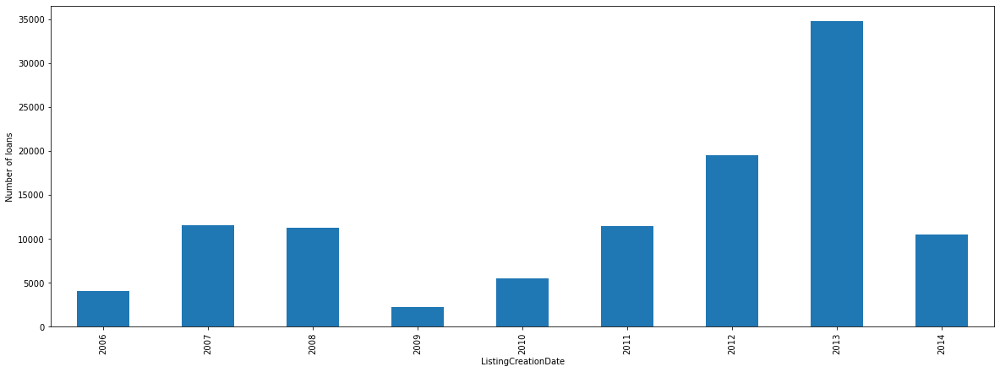

In [66]:
prosper_reduced_data.groupby(prosper_reduced_data.ListingCreationDate.dt.year)['ListingKey'].count().plot(kind = 'bar');
plt.ylabel('Number of loans');

In [67]:
# 2009 was a critical year because of the financial crisis

In [68]:
prosper_reduced_data.ClosedDate.describe()

count                   52821
unique                   2682
top       2014-03-04 00:00:00
freq                      105
first     2006-05-10 00:00:00
last      2014-03-10 00:00:00
Name: ClosedDate, dtype: object

In [69]:
#we have 57990 accounts still open
prosper_reduced_data.ClosedDate.isnull().sum()

57990

In [70]:
# months between loan origination and closing date
prosper_reduced_data['MonthsToClosed'] = ((prosper_reduced_data.ClosedDate - prosper_reduced_data.ListingCreationDate) / np.timedelta64(1, 'M'))

In [71]:
prosper_reduced_data['MonthsToClosed'].describe()

count    52821.000000
mean        19.656067
std         11.684394
min        -45.421942
25%          9.645909
50%         17.455657
75%         31.265634
max         66.324018
Name: MonthsToClosed, dtype: float64

In [72]:
# we have accounts which have months to close as  negative which is errornous 

In [73]:
prosper_reduced_data[prosper_reduced_data['MonthsToClosed'] < 0]

,ListingKey,ListingCreationDate,ClosedDate,LoanStatus,Term,LoanOriginalAmount,MonthlyLoanPayment,ListingCategory,BorrowerAPR,BorrowerRate,CreditScoreRangeLower,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,DebtToIncomeRatio,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CreditRiskScore,MonthsToClosed
108297,DEAA359893047281162F432,2013-12-27 12:02:50.107,2010-03-16,Defaulted,36,2500,82.31,1,0.14206,0.1139,660.0,"$75,000-99,999",False,6250.0,NaN,Self-employed,7.0,False,A,-45.421942


In [74]:
prosper_reduced_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 110811 entries, 0 to 113936
Data columns (total 20 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   ListingKey                110811 non-null  object        
 1   ListingCreationDate       110811 non-null  datetime64[ns]
 2   ClosedDate                52821 non-null   datetime64[ns]
 3   LoanStatus                110811 non-null  object        
 4   Term                      110811 non-null  int64         
 5   LoanOriginalAmount        110811 non-null  int64         
 6   MonthlyLoanPayment        110811 non-null  float64       
 7   ListingCategory           110811 non-null  category      
 8   BorrowerAPR               110811 non-null  float64       
 9   BorrowerRate              110811 non-null  float64       
 10  CreditScoreRangeLower     110809 non-null  float64       
 11  IncomeRange               110811 non-null  category      
 12  In

In [75]:
# This account creation Date is less than Closed Date. We will drop it from our analysis

In [76]:
prosper_reduced_data_check = prosper_reduced_data[prosper_reduced_data['MonthsToClosed'] > 0]

In [77]:
prosper_reduced_data['MonthsToClosed'].describe()

count    52821.000000
mean        19.656067
std         11.684394
min        -45.421942
25%          9.645909
50%         17.455657
75%         31.265634
max         66.324018
Name: MonthsToClosed, dtype: float64

In [78]:
prosper_reduced_data.columns

Index(['ListingKey', 'ListingCreationDate', 'ClosedDate', 'LoanStatus', 'Term',
       'LoanOriginalAmount', 'MonthlyLoanPayment', 'ListingCategory',
       'BorrowerAPR', 'BorrowerRate', 'CreditScoreRangeLower', 'IncomeRange',
       'IncomeVerifiable', 'StatedMonthlyIncome', 'DebtToIncomeRatio',
       'EmploymentStatus', 'EmploymentStatusDuration', 'IsBorrowerHomeowner',
       'CreditRiskScore', 'MonthsToClosed'],
      dtype='object')

In [79]:
#dropping date columns, interestRate and listingkey since we won't need them further
prosper_reduced_data.drop(columns = ['ListingKey','BorrowerRate', 'ListingCreationDate', 'ClosedDate'], inplace = True)

In [80]:
prosper_reduced_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 110811 entries, 0 to 113936
Data columns (total 16 columns):
 #   Column                    Non-Null Count   Dtype   
---  ------                    --------------   -----   
 0   LoanStatus                110811 non-null  object  
 1   Term                      110811 non-null  int64   
 2   LoanOriginalAmount        110811 non-null  int64   
 3   MonthlyLoanPayment        110811 non-null  float64 
 4   ListingCategory           110811 non-null  category
 5   BorrowerAPR               110811 non-null  float64 
 6   CreditScoreRangeLower     110809 non-null  float64 
 7   IncomeRange               110811 non-null  category
 8   IncomeVerifiable          110811 non-null  bool    
 9   StatedMonthlyIncome       110811 non-null  float64 
 10  DebtToIncomeRatio         102368 non-null  float64 
 11  EmploymentStatus          110811 non-null  object  
 12  EmploymentStatusDuration  105441 non-null  float64 
 13  IsBorrowerHomeowner       110

### Discuss the distribution(s) of your variable(s) of interest. Were there any unusual points? Did you need to perform any transformation

<li>I created a new credit rating variable. This was done by merging two existing rating variables</li>
<li>LoanOriginalAmount, EmploymentstatusDuration, MonthlyLoanPayment: These columns are positively Skewed. </li>
<li>CreditRiskRange columns were similar so I dropped one of them</li>

### Of the features you investigated, were there any unusual distributions? Did you perform any operations on the data to tidy, adjust, or change the form of the data? If so, why did you do this?

<li>I deleted two loans which had their closed date earlier than the loan origination date.</li>

<li>I reduced the number of income ranges by one by merging USD 0 with Not Employed into the same category.</li>

## Bivariate Exploration


In [81]:
prosper_reduced_data_samp =  prosper_reduced_data.sample(frac = 0.3, random_state = 1) 
prosper_reduced_data_samp_numerical = prosper_reduced_data_samp.select_dtypes(include=numerics)


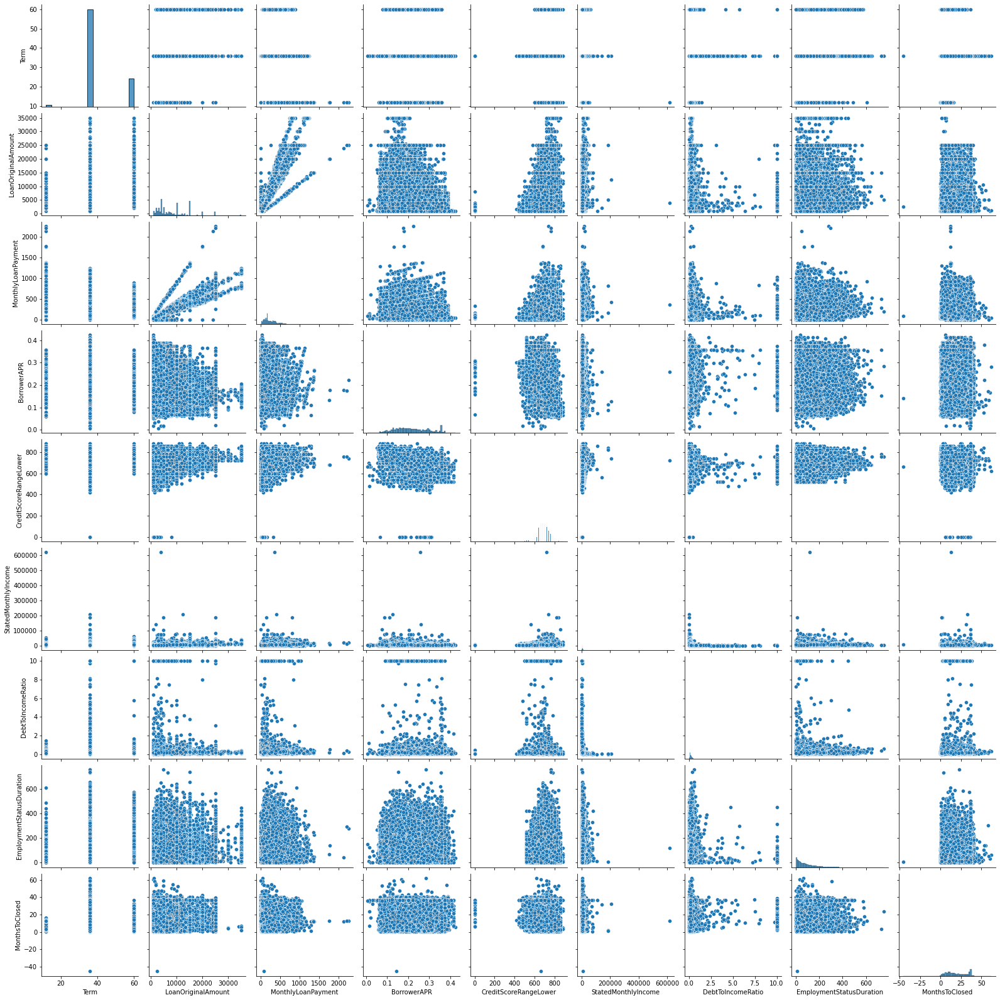

In [82]:
sns.pairplot(prosper_reduced_data_samp_numerical);

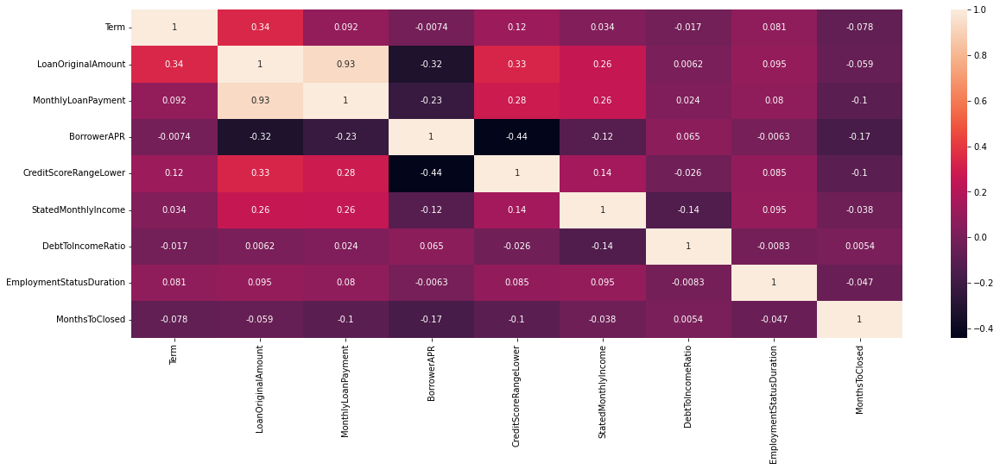

In [83]:
#Correlation matrix
sns.heatmap(prosper_reduced_data_samp_numerical.corr(), annot = True);

Based on our dependant variable, *BorrowerAPR*, we can see significant correlations with the following variables: 

Negative Correlation with LoanOriginalAmount, MonthlyLoanPayment,CreditScoreRangeLower

Additionally, we can see positive correlations in LoanOriginalAmount with MonthlyLoanPayment, CreditScoreRangeLower, StatedMonthlyIncome


In [84]:
def ScatterPlots(df, col):
    sns.regplot(data = df, x = df[col], y = df.BorrowerAPR, scatter_kws={'alpha':0.3}, y_jitter = 0.2)
    plt.show()

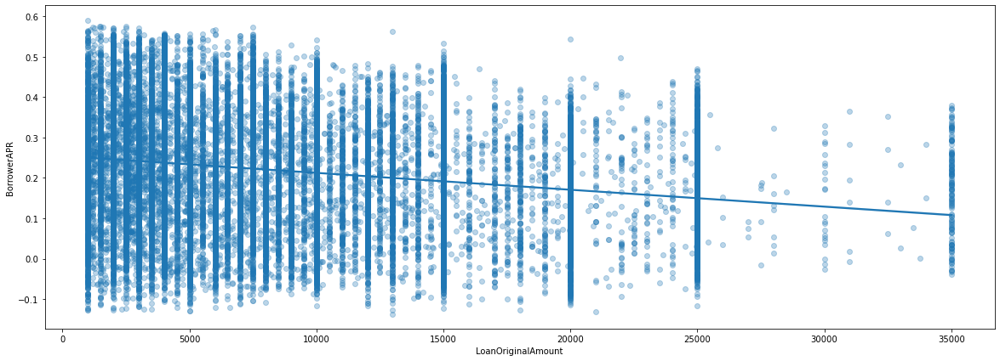

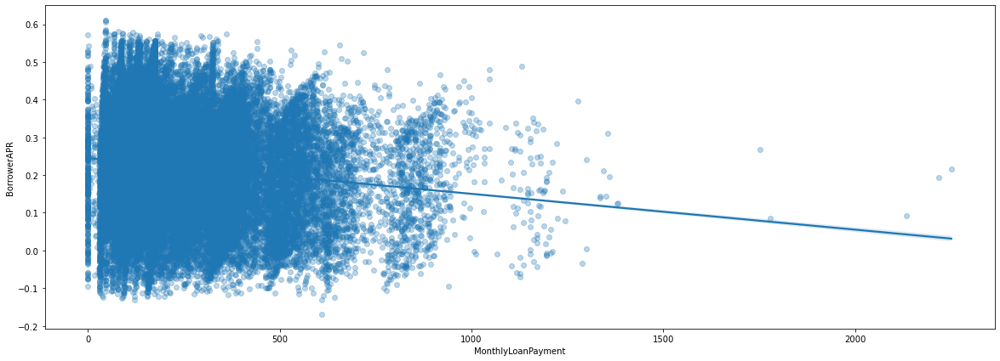

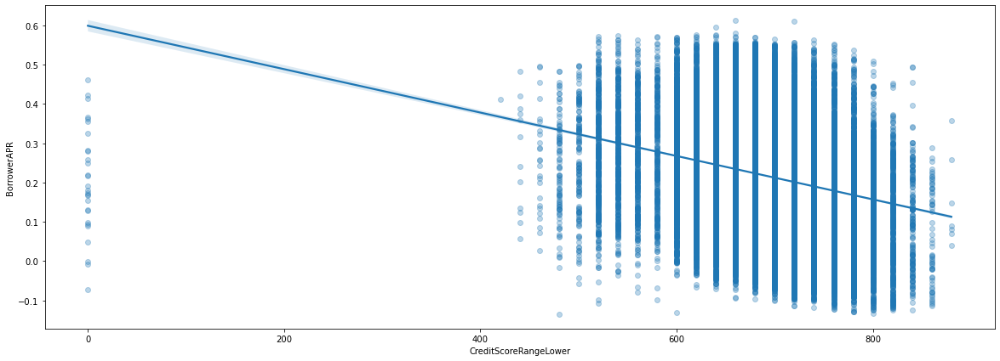

In [85]:
# With Outliers
correlated_cols = ['LoanOriginalAmount', 'MonthlyLoanPayment','CreditScoreRangeLower']

for col in correlated_cols:
    ScatterPlots(prosper_reduced_data_samp_numerical, col)

In [86]:
#Capping outliers so as to get a clear view of APR vs Correlated variables
def cap_data(df):
    for col in df.columns:
        print("capping the ",col)
        if (((df[col].dtype)=='float64') | ((df[col].dtype)=='int64')):
            percentiles = df[col].quantile([0.01,0.99]).values
            df[col][df[col] <= percentiles[0]] = percentiles[0]
            df[col][df[col] >= percentiles[1]] = percentiles[1]
        else:
            df[col]=df[col]
    return df

final_df=cap_data(prosper_reduced_data_samp_numerical)

capping the  Term
capping the  LoanOriginalAmount
capping the  MonthlyLoanPayment
capping the  BorrowerAPR
capping the  CreditScoreRangeLower
capping the  StatedMonthlyIncome
capping the  DebtToIncomeRatio
capping the  EmploymentStatusDuration
capping the  MonthsToClosed


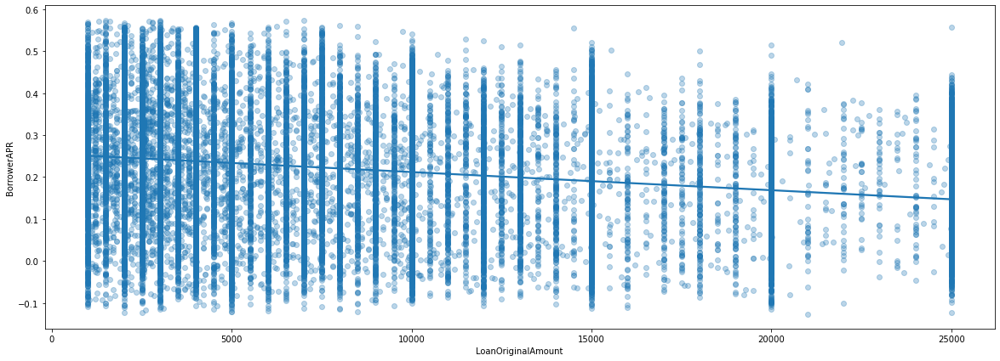

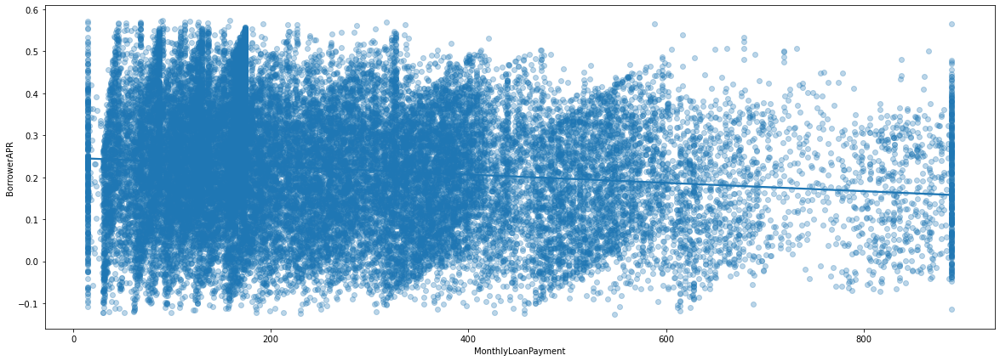

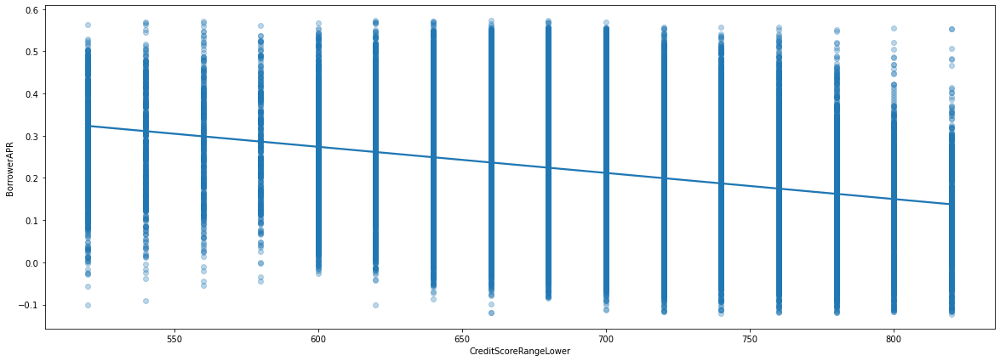

In [87]:
for col in correlated_cols:
    ScatterPlots(final_df, col)

The negative correlations of BorrowerAPR and loan original amount, monthly loan payment and credit score range lower are somewhat visible from the scatter plots and they all make logical sense.

Let's check the same with relationship between Correlated columns with Loan Original Amount

In [88]:
def ScatterPlots(df, col, y_axis):
    sns.regplot(data = df, x = df[col], y = df[y_axis], scatter_kws={'alpha':0.3}, y_jitter = 0.2)
    plt.show()

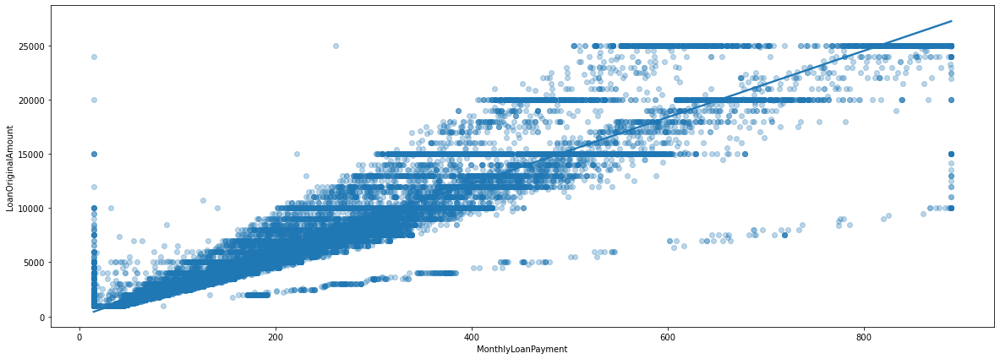

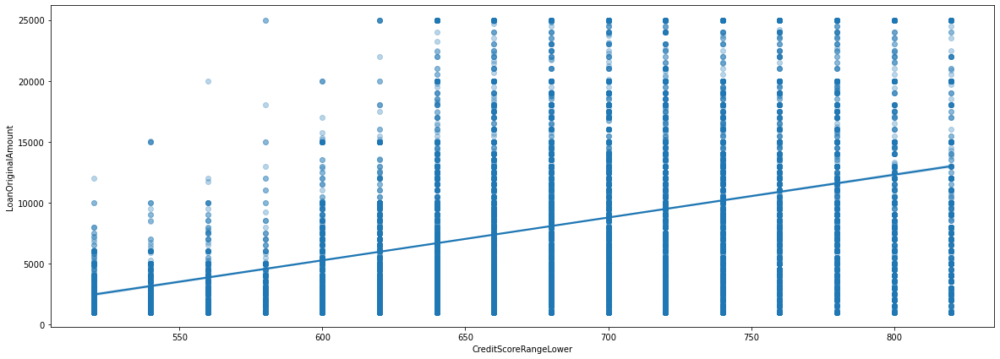

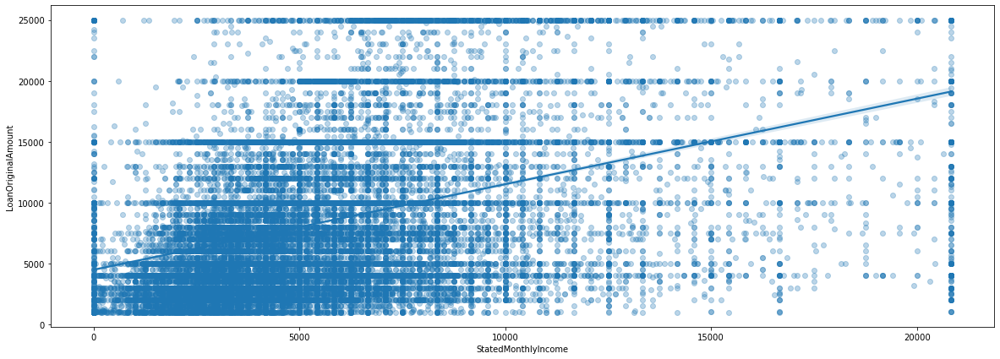

In [89]:
correlated_cols = ['MonthlyLoanPayment', 'CreditScoreRangeLower', 'StatedMonthlyIncome']
for col in correlated_cols:
    ScatterPlots(final_df, col, 'LoanOriginalAmount')

With the above selected variable, there is positive correlation with Loan original Amount

## Categorical variables

In [90]:
prosper_reduced_data_samp

,LoanStatus,Term,LoanOriginalAmount,MonthlyLoanPayment,ListingCategory,BorrowerAPR,CreditScoreRangeLower,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,DebtToIncomeRatio,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CreditRiskScore,MonthsToClosed
84581,Current,36,20000,703.04,1,0.19645,740.0,"$25,000-49,999",True,2916.666667,0.78,Employed,414.0,False,B,NaN
75489,Current,60,10000,253.66,1,0.20347,700.0,"$50,000-74,999",True,5884.083333,0.36,Employed,388.0,True,C,NaN
112937,Completed,36,1200,45.44,1,0.23635,580.0,"$25,000-49,999",True,4041.666667,0.14,Full-time,2.0,True,E,10.817918
97928,Current,36,7550,249.08,1,0.14348,760.0,"$50,000-74,999",True,5666.666667,0.10,Employed,2.0,True,A,NaN
15126,Defaulted,36,5000,173.33,0,0.15713,640.0,"$25,000-49,999",True,3880.000000,0.07,Full-time,69.0,False,C,28.391151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36372,Current,60,9000,232.23,1,0.21192,660.0,"$50,000-74,999",True,4583.333333,0.08,Employed,1.0,False,C,NaN
22562,Completed,36,8500,275.63,8,0.13138,760.0,"$75,000-99,999",True,6250.000000,0.24,Employed,147.0,True,A,8.628991
108827,Current,36,4000,135.84,1,0.17151,680.0,"$25,000-49,999",True,2500.000000,0.22,Employed,39.0,False,B,NaN
102049,Current,36,10000,400.35,1,0.29394,680.0,"$50,000-74,999",False,5000.000000,NaN,Employed,121.0,False,D,NaN


<Figure size 864x1440 with 0 Axes>

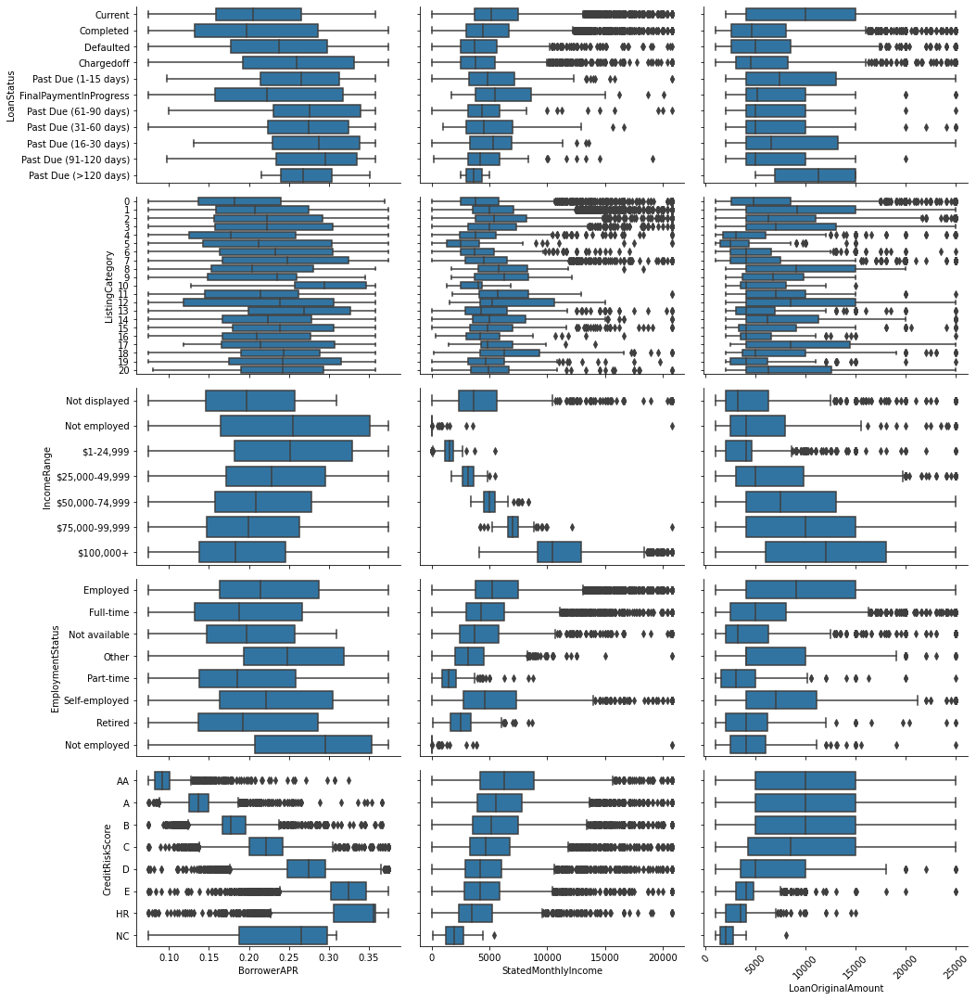

In [91]:
# plot matrix of numeric features against categorical features.

def boxgrid(x, y, **kwargs):
    """ Quick hack for creating box plots with seaborn's PairGrid. """
    default_color = sns.color_palette()[0]
    sns.boxplot(x, y, color = default_color)

plt.figure(figsize = [12, 20])
g = sns.PairGrid(data = prosper_reduced_data_samp, x_vars = ['BorrowerAPR', 'StatedMonthlyIncome', 'LoanOriginalAmount'], 
                y_vars = prosper_reduced_data_object.columns, size = 3, aspect = 1.5)
g.map(boxgrid);
plt.xticks(rotation=45);

For the above boxplot we can see that;

- CreditRiskScore - Borrower's with low creditRiskscore tend to have have high borrower APR score and it reduces with better scores. They also get low Loan amounts and have a lower Monthly income compared to those with better CreditRiskScore
- Employment Status - Unemployed borrowers tend to have high APR score. An interesting bit on this is retired borowers tend to have a low APR and get Low Original Loan amount which is against the norm of High APR Score = Low LoanOriginalScore
- IncomeRange - The higher you income the lower your APR and the higher the amount of Loan given
- Loan Status - Good Borrower's(current and Completed) tend to have low APR compared to bad customers(Defaulters and Past Due)

## Boolean Variables

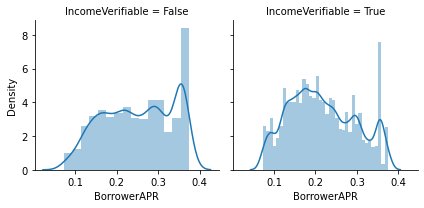

In [92]:
g = sns.FacetGrid(data = prosper_reduced_data_samp, col = 'IncomeVerifiable')
g.map(sns.distplot, 'BorrowerAPR');

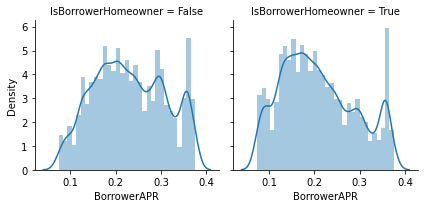

In [93]:
g = sns.FacetGrid(data = prosper_reduced_data_samp, col = 'IsBorrowerHomeowner')
g.map(sns.distplot, 'BorrowerAPR');

Note;

- IncomeVerifiable -  Verified Income borrower's have a lower APR than Unverified borrowers.
- IsBorrowerHomeowner - Homeowners get a slightly lower APR compared to non-homeowners

### Talk about some of the relationships you observed in this part of the investigation. How did the feature(s) of interest vary with other features in the dataset?

The borrower APR is negatively associated with the loan original amount, which mean the more the loan amount, the lower the APR. It also shows that at different size of the loan amount, the APR has a large range, but the range of APR decrease with the increase of loan amount. The Prosper rating also has a strong effect on the borrower APR, which decreases with the better rating.

### Did you observe any interesting relationships between the other features (not the main feature(s) of interest)?

The loan original amount is positively correlated with the stated monthly income, it makes sense since borrowers with more monthly income could loan more money. It also shows that borrowers with better rating also have larger monthly income and loan amount. retired borowers tend to have a low APR and get Low Original Loan amount which is against the norm of High APR Score = Low LoanOriginalAmount. Also, There is much difference between homeowner's APR with non-homeowners

## Multivariate Exploration

This section will build on previous findings and combine multiple variables to see how they interact.
A few sections will follow, each focusing on one variable and its relationship with others.

In [94]:
prosper_reduced_data_samp_numerical.columns

Index(['Term', 'LoanOriginalAmount', 'MonthlyLoanPayment', 'BorrowerAPR',
       'CreditScoreRangeLower', 'StatedMonthlyIncome', 'DebtToIncomeRatio',
       'EmploymentStatusDuration', 'MonthsToClosed'],
      dtype='object')

In [95]:
plt.figure(figsize=(13,4))

<Figure size 936x288 with 0 Axes>

<Figure size 936x288 with 0 Axes>

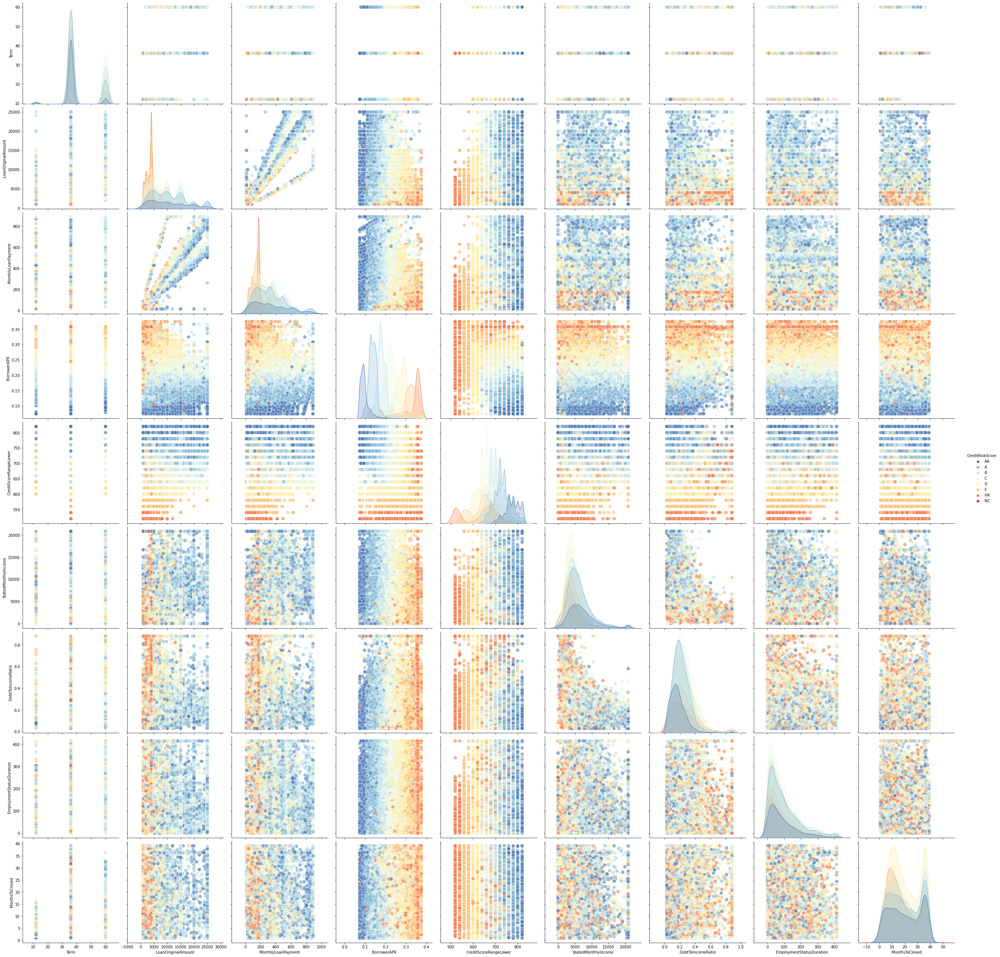

In [96]:
# Pair plot colored by credit risk
sns.pairplot(prosper_reduced_data_samp, 
             vars = prosper_reduced_data_samp_numerical.columns, 
             hue = 'CreditRiskScore', diag_kind = 'kde', palette = 'RdYlBu_r',
             plot_kws = {'alpha': 0.6, 's': 90},
             size = 4);

We can see separation between the different creditScoreGroups 

<Figure size 1152x1080 with 0 Axes>

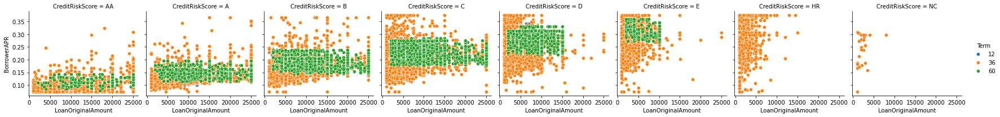

In [97]:
plt.figure(figsize=(16,15))
g = sns.FacetGrid(data = prosper_reduced_data_samp, col = 'CreditRiskScore', hue = 'Term');
g.map(sns.scatterplot, 'LoanOriginalAmount', 'BorrowerAPR');
g.add_legend()
plt.show();

In all Most CreditRiskGroups, the APR tends to be higher in 36 months compared to 60 Months

<Figure size 1152x1080 with 0 Axes>

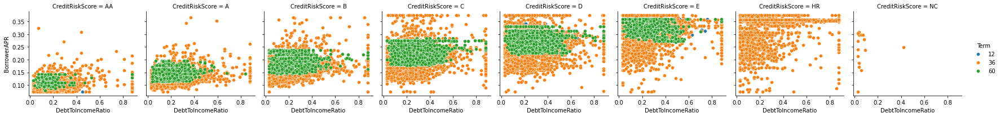

In [98]:
plt.figure(figsize=(16,15))
g = sns.FacetGrid(data = prosper_reduced_data_samp, col = 'CreditRiskScore', hue = 'Term');
g.map(sns.scatterplot, 'DebtToIncomeRatio' , 'BorrowerAPR');
g.add_legend()
plt.show();

In most CreditRiskGroups, the lower your debttoincomeRatio the lower the borrower's APR.

## EmploymentStatus

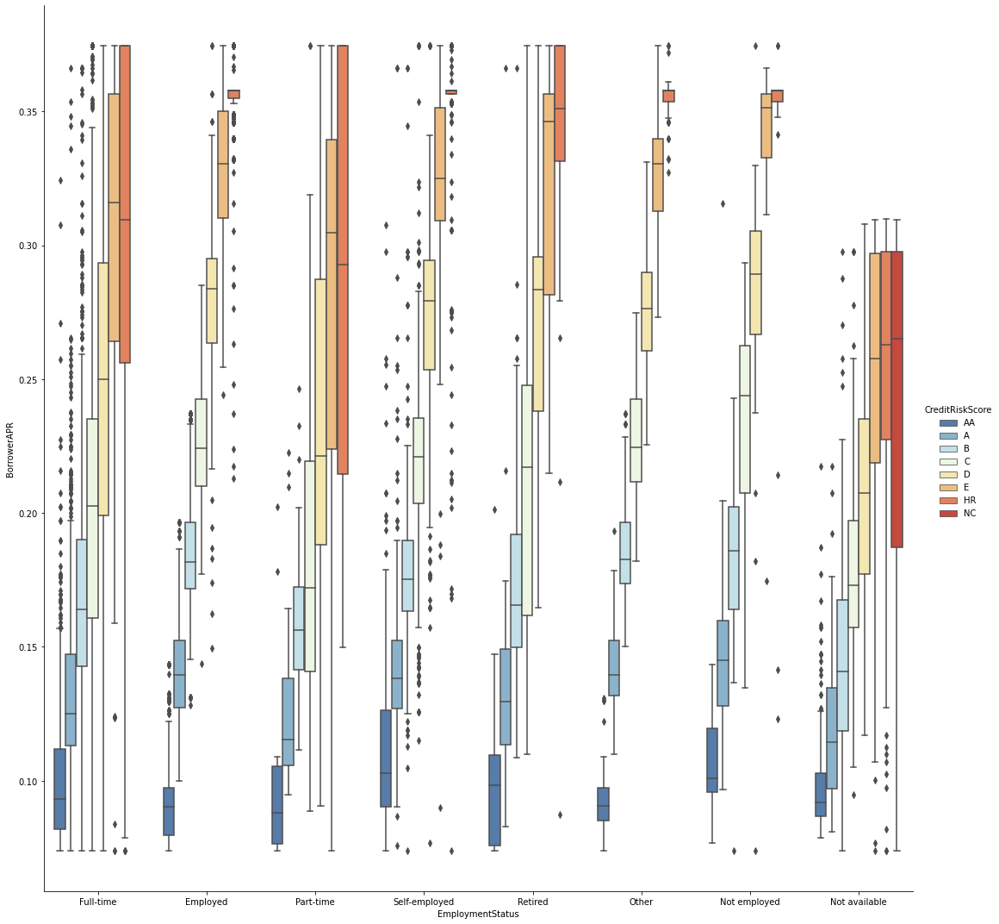

In [99]:
sns.catplot(x = 'EmploymentStatus', y = 'BorrowerAPR', hue = 'CreditRiskScore', order = \
           ['Full-time','Employed','Part-time','Self-employed','Retired','Other','Not employed','Not available'], \
           kind = 'box', data = prosper_reduced_data_samp, size = 15, palette = 'RdYlBu_r');

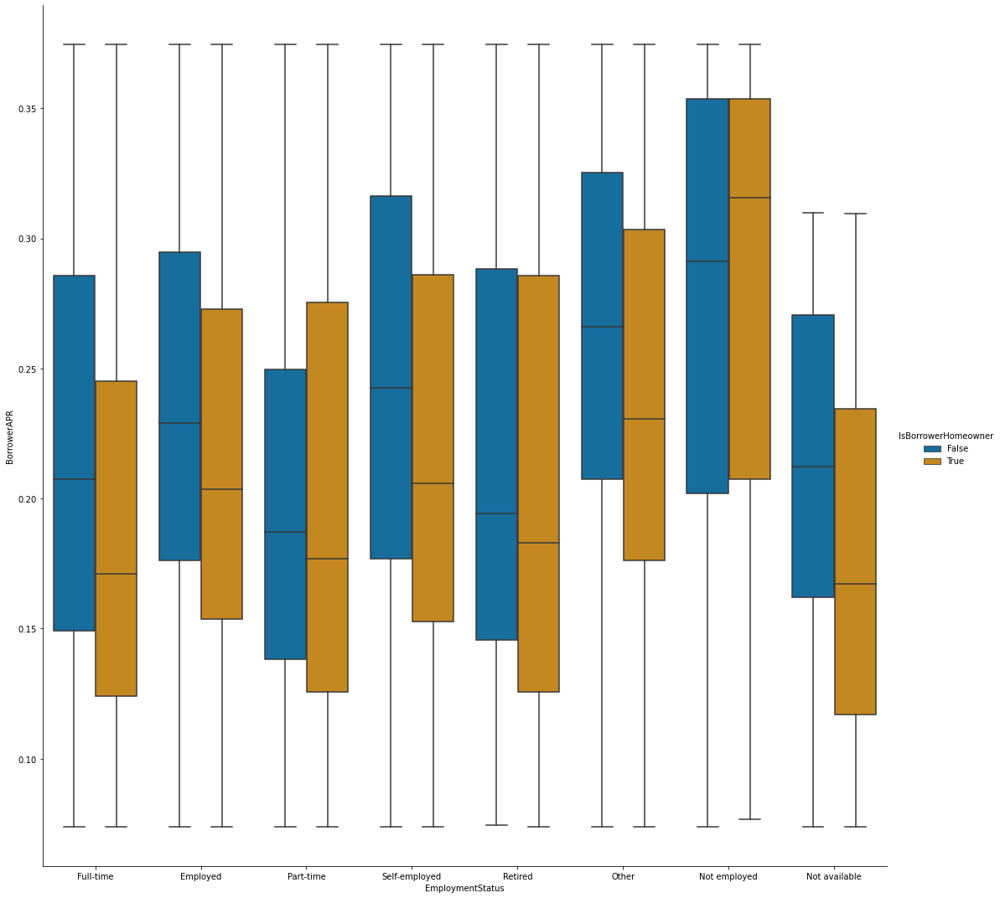

In [100]:
sns.catplot(x = 'EmploymentStatus', y = 'BorrowerAPR', hue = 'IsBorrowerHomeowner', order = \
           ['Full-time','Employed','Part-time','Self-employed','Retired','Other','Not employed','Not available'], \
           kind = 'box', data = prosper_reduced_data_samp, size = 15, palette = 'colorblind');

Differences among employment statuses are not very significant or consistent. It makes it difficult to make any conclusion

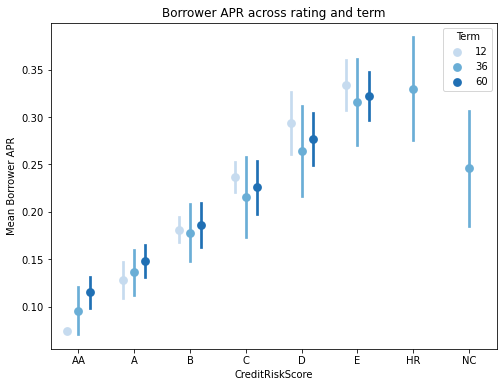

In [101]:
fig = plt.figure(figsize = [8,6])
ax = sns.pointplot(data = prosper_reduced_data_samp, x = 'CreditRiskScore', y = 'BorrowerAPR', hue = 'Term',
           palette = 'Blues', linestyles = '', dodge = 0.4, ci='sd')
plt.title('Borrower APR across rating and term')
plt.ylabel('Mean Borrower APR')
ax.set_yticklabels([],minor = True);

It is interesting that for borrowers with creditScore category AA and A, there APR tend to increase with increased term length compared to higher risk borrowers D and E where 12 months term tend to have highest APR and it reduces for the other groups

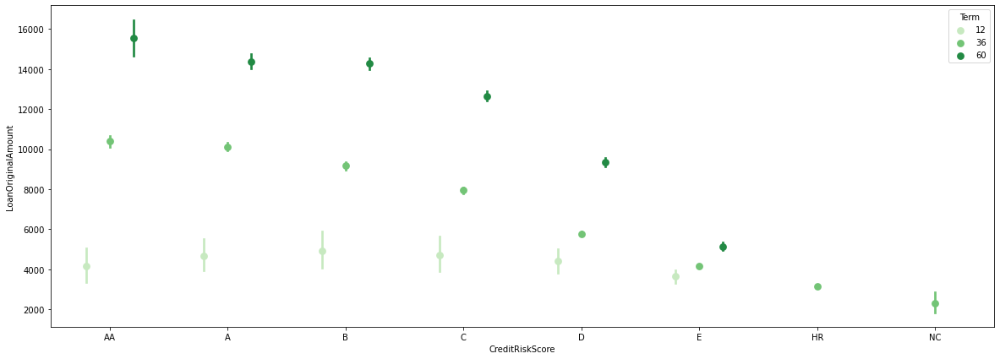

In [102]:
sns.pointplot(data = prosper_reduced_data_samp, x = 'CreditRiskScore', y = 'LoanOriginalAmount', hue = 'Term',
           palette = 'Greens', linestyles = '', dodge = 0.4);

there is a interaction between term and rating. We can see that with better Credit Score rating, the loan amount of all three terms increases, the increase amplitude of loan amount between terms also becomes larger.

### Talk about some of the relationships you observed in this part of the investigation. Were there features that strengthened each other in terms of looking at your feature(s) of interest?

Credit risk category, as expected and hoped, is a major factor which segments the borrowers into clearly distinguishable groups.
Being assigned into one of the risk categories strongly determines the interest rate and the borrowed amount.

### Were there any interesting or surprising interactions between features?
 There wasn't much between homeowners and non-homeowners between any employment groups

In [103]:
prosper_reduced_data_samp.to_csv('Sampled Prosper Data.csv', index = False)